In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
train = pd.read_csv("/content/DengAI_Predicting_Disease_Spread_-_Training_Data_Features.csv")

In [3]:
train.sample(5)

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
1124,iq,2004,7,2004-02-12,0.278743,0.298757,0.312714,0.304829,24.83,298.270000,...,33.46,86.765714,24.83,17.174286,8.500000,27.925000,9.500000,33.3,22.8,13.4
522,sj,2000,19,2000-05-13,NaN,0.098150,0.149086,0.134386,21.53,298.320000,...,16.35,78.337143,21.53,15.638571,2.771429,26.642857,6.914286,30.6,22.2,7.7
1002,iq,2001,41,2001-10-08,0.420286,0.381957,0.443800,0.546017,58.75,299.158571,...,12.30,74.418571,58.75,15.327143,11.342857,28.525000,12.475000,36.8,21.8,30.9
978,iq,2001,17,2001-04-23,0.245614,0.214843,0.273371,0.228800,78.01,297.961429,...,78.30,88.148571,78.01,16.968571,10.242857,27.633333,10.933333,34.3,21.0,14.9
102,sj,1992,16,1992-04-15,0.075150,0.097433,0.159029,0.172986,83.11,297.831429,...,70.60,84.184286,83.11,16.324286,2.142857,26.814286,5.885714,31.7,22.8,24.5


In [4]:
test = pd.read_csv("/content/DengAI_Predicting_Disease_Spread_-_Test_Data_Features.csv")

In [5]:
test.sample(5)

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
23,sj,2008,41,2008-10-07,0.130600,0.089700,0.186086,0.196443,6.16,300.715714,...,21.1,76.361429,6.16,17.617143,2.914286,28.171429,5.942857,31.7,24.4,8.5
327,iq,2011,41,2011-10-15,0.267300,0.252814,0.218143,0.296700,43.29,298.130000,...,52.3,91.265714,43.29,18.012857,9.800000,27.750000,10.600000,33.7,21.4,36.8
125,sj,2010,38,2010-09-24,0.110100,0.078067,0.154143,0.108771,11.72,301.090000,...,27.6,78.362857,11.72,18.555714,3.185714,28.642857,6.500000,33.3,25.0,71.7
318,iq,2011,32,2011-08-13,0.322914,0.334943,0.293471,0.335500,7.30,297.454286,...,79.9,86.355714,7.30,16.032857,11.642857,27.020000,11.560000,34.2,20.4,NaN
74,sj,2009,40,2009-10-01,NaN,0.006025,0.157100,0.142743,43.31,301.144286,...,15.4,78.551429,43.31,18.581429,3.014286,29.357143,5.785714,33.3,25.6,1.6


In [6]:
test.shape

(416, 24)

In [7]:
feat_train=pd.read_csv("/content/DengAI_Predicting_Disease_Spread_-_Training_Data_Labels.csv")

In [8]:
feat_train.sample(5)

,city,year,weekofyear,total_cases
446,sj,1998,48,85
659,sj,2003,1,11
14,sj,1990,32,23
643,sj,2002,37,6
338,sj,1996,44,33


In [9]:
feat_train.shape

(1456, 4)

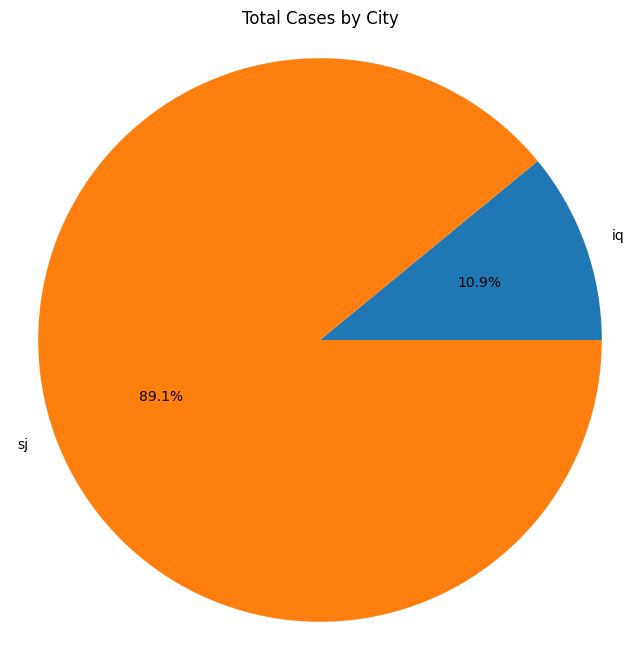

In [10]:
city_totals = feat_train.groupby('city')['total_cases'].sum()

plt.figure(figsize=(8, 8))
plt.pie(city_totals, labels=city_totals.index, autopct='%1.1f%%')
plt.title('Total Cases by City')
plt.axis('equal')
plt.show()

In [11]:
#train.fillna(0, inplace=True)
train=train.dropna()

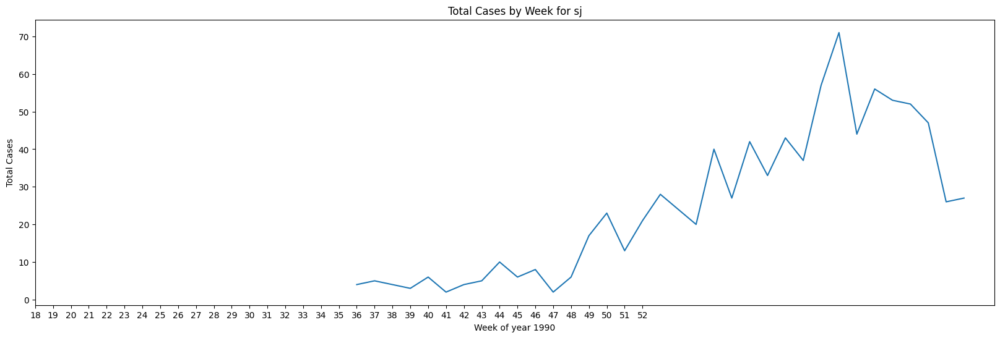

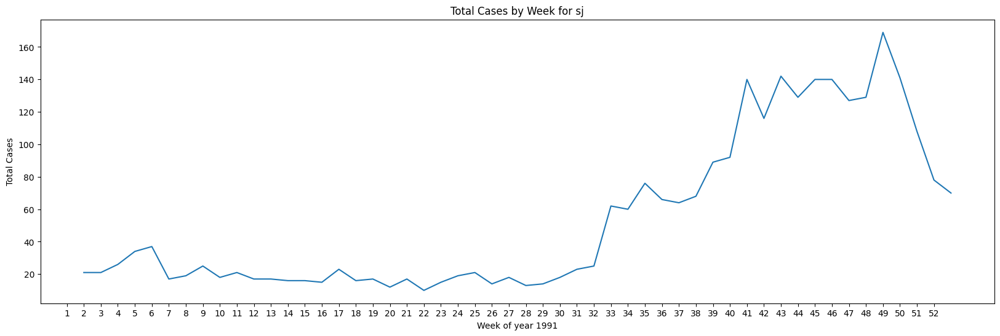

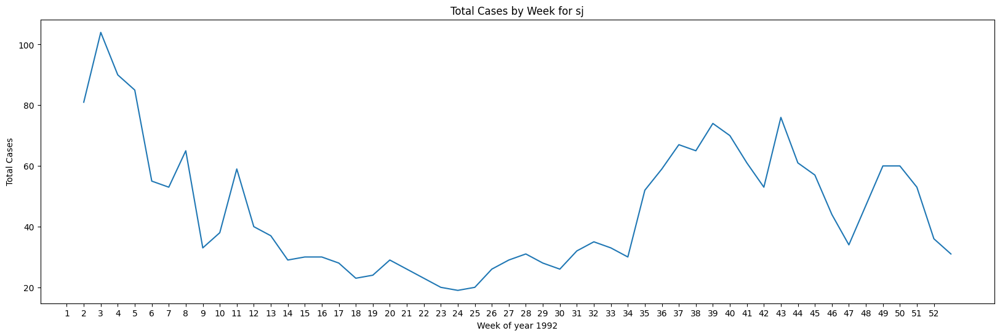

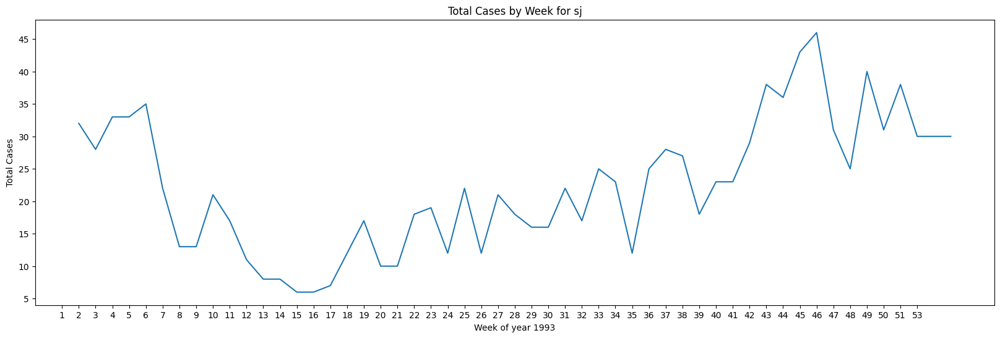

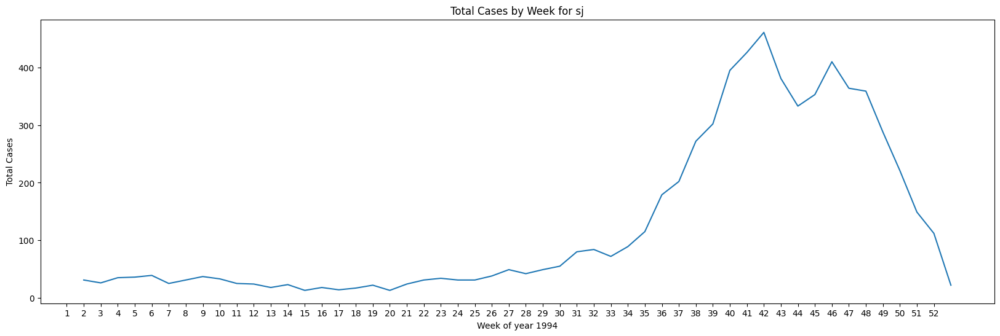

...

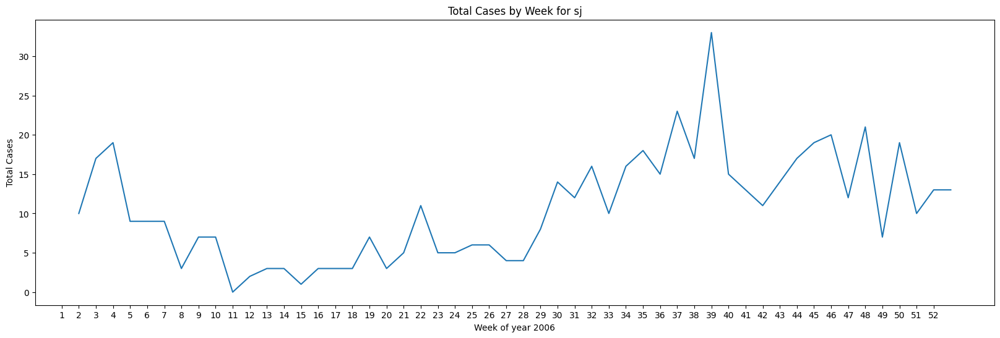

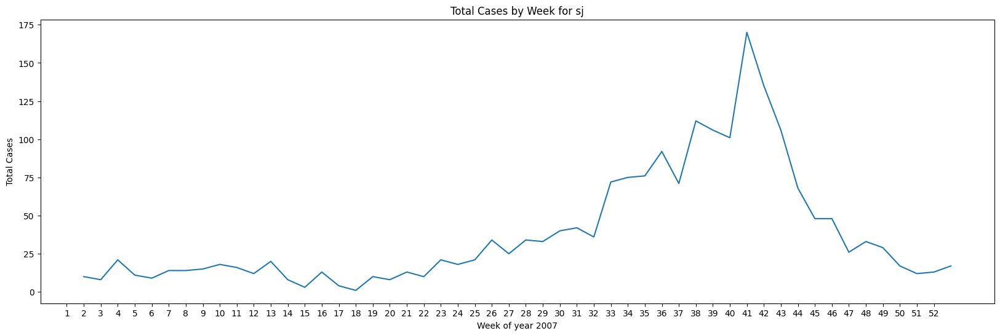

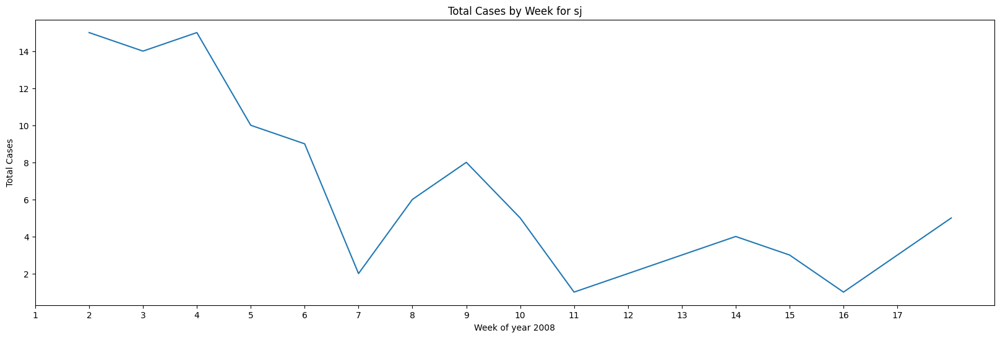

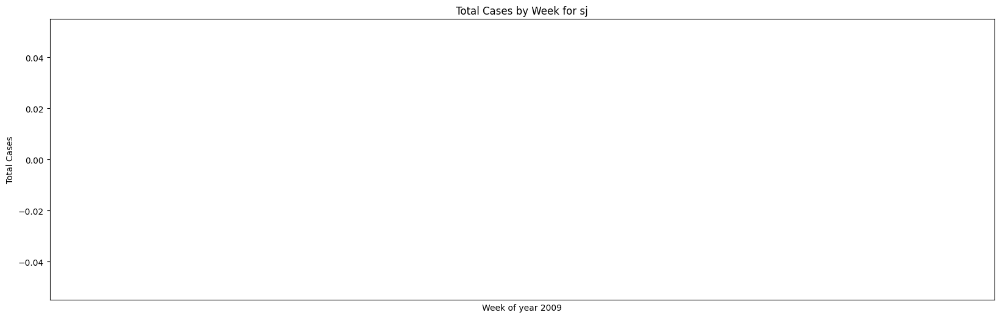

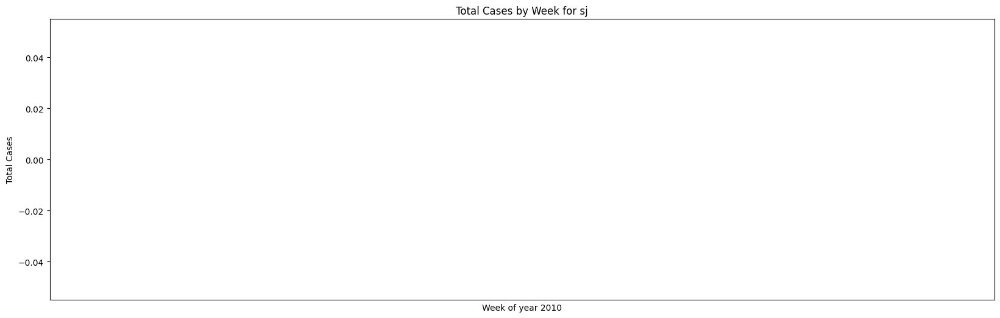

In [12]:
city = 'sj'
for i in range(1990,2011):
  city_by_year_df = feat_train[(feat_train['city'] == city) & (feat_train['year'] == i)]

  week_totals = city_by_year_df.groupby('weekofyear')['total_cases'].sum()

  plt.figure(figsize=(20, 6))
  plt.plot(week_totals)
  plt.title(f'Total Cases by Week for {city}')
  plt.xlabel(f'Week of year {i}')
  plt.ylabel('Total Cases')
  plt.xticks(range(len(week_totals)), week_totals.index)
  plt.show()

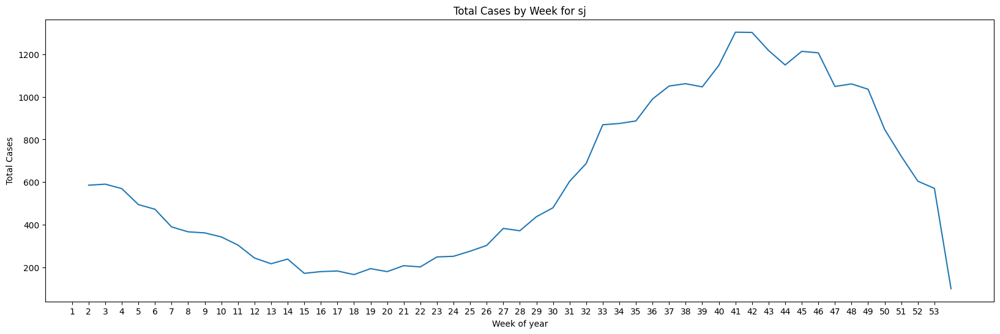

In [13]:
city = 'sj'
city_df = feat_train[feat_train['city'] == city]
week_totals = city_df.groupby('weekofyear')['total_cases'].sum()

plt.figure(figsize=(20, 6))
plt.plot(week_totals)
plt.title(f'Total Cases by Week for {city}')
plt.xlabel(f'Week of year')
plt.ylabel('Total Cases')
plt.xticks(range(len(week_totals)), week_totals.index)
plt.show()

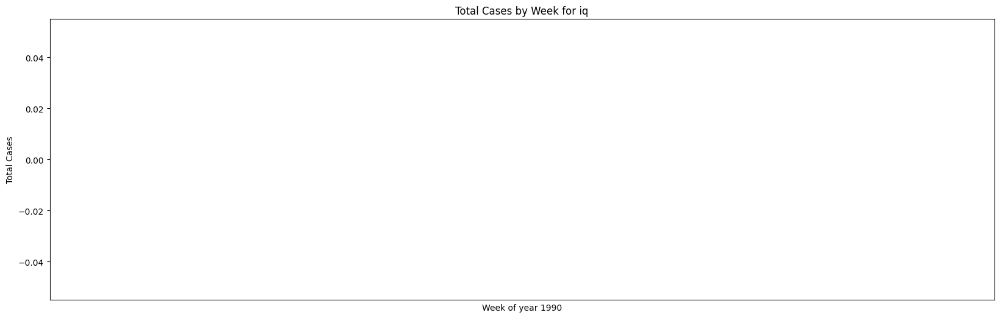

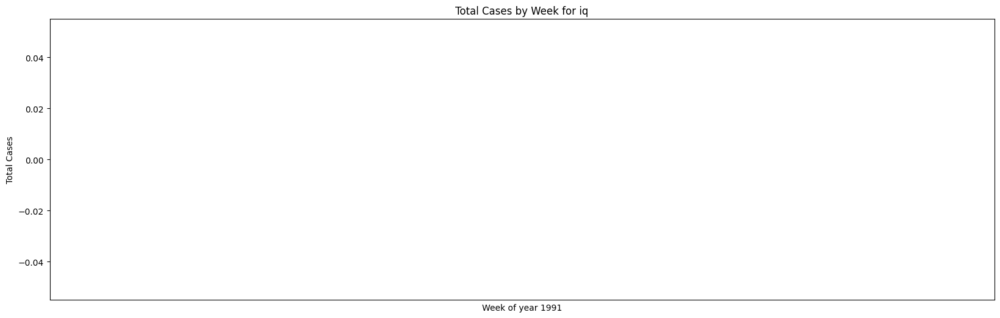

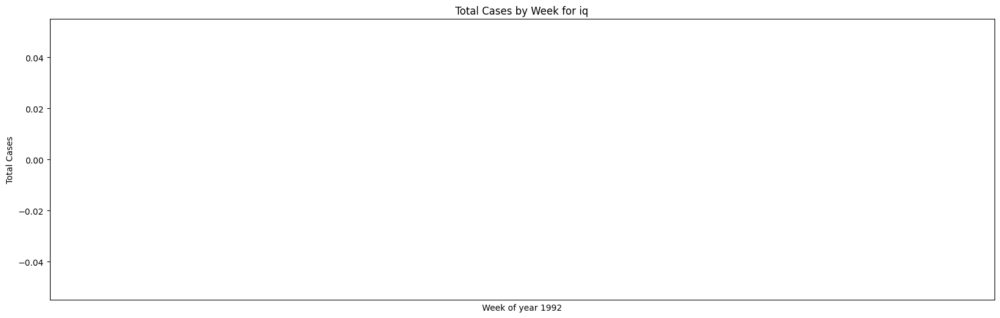

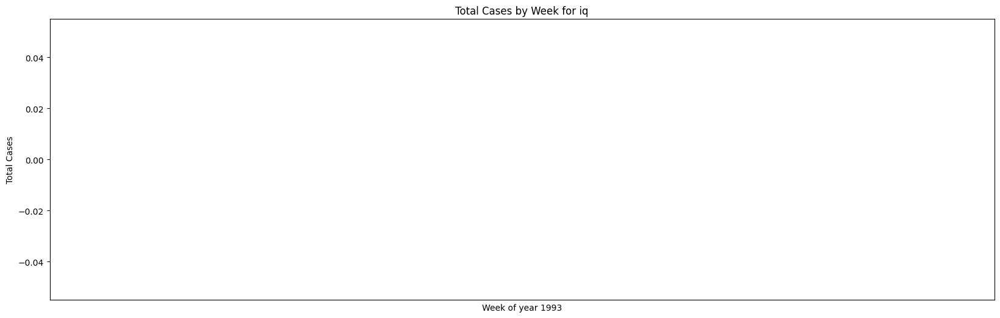

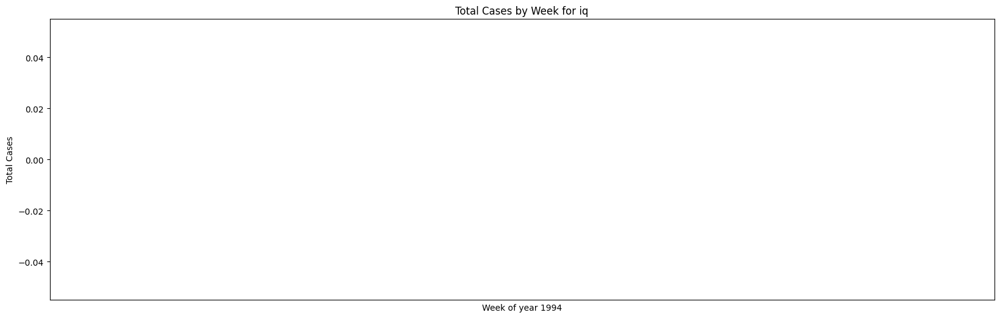

...

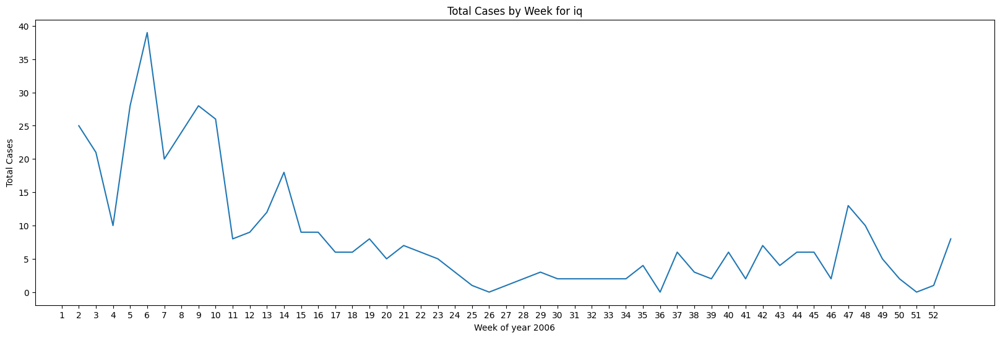

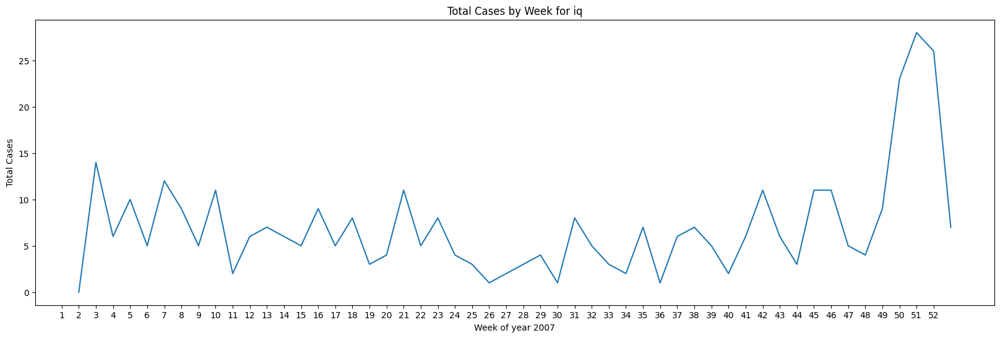

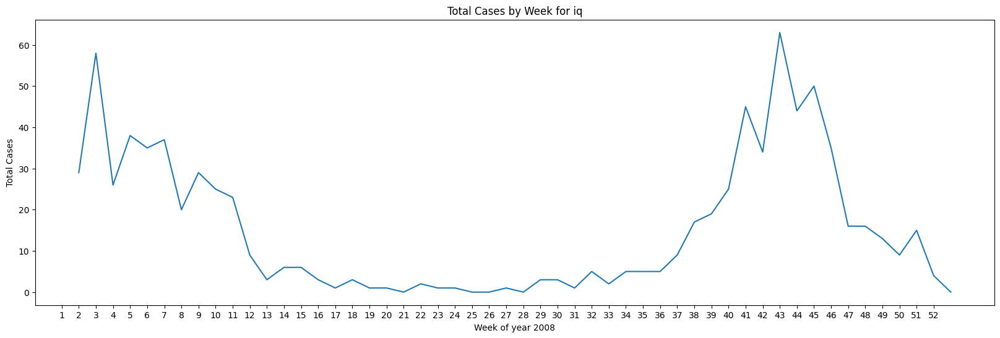

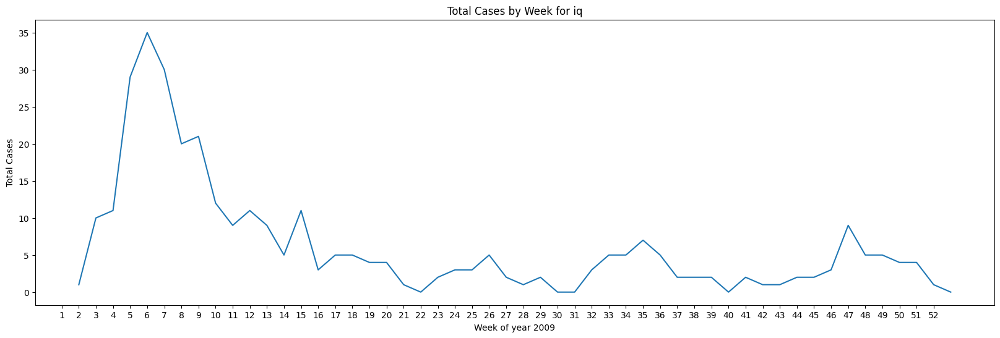

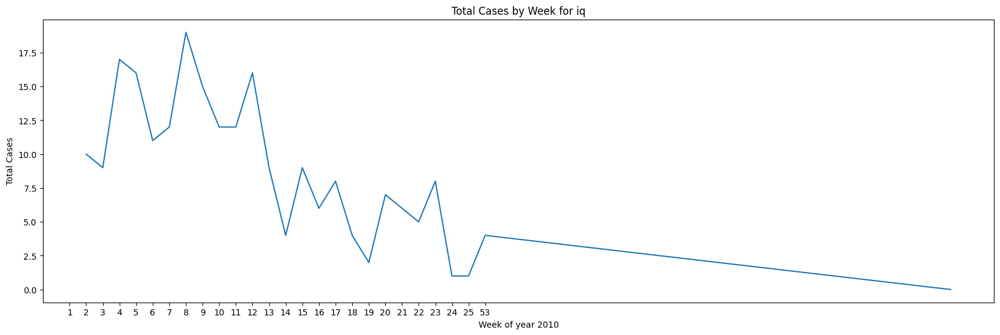

In [14]:
city = 'iq'
for i in range(1990,2011):
  city_by_year_df = feat_train[(feat_train['city'] == city) & (feat_train['year'] == i)]

  week_totals = city_by_year_df.groupby('weekofyear')['total_cases'].sum()

  plt.figure(figsize=(20, 6))
  plt.plot(week_totals)
  plt.title(f'Total Cases by Week for {city}')
  plt.xlabel(f'Week of year {i}')
  plt.ylabel('Total Cases')
  plt.xticks(range(len(week_totals)), week_totals.index)
  plt.show()

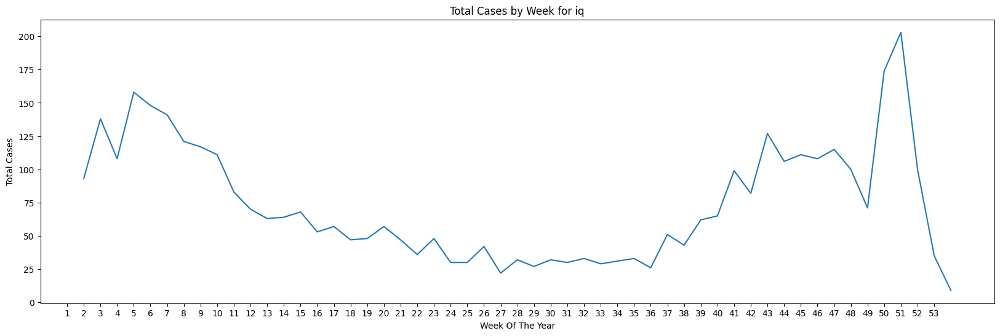

In [15]:
city = 'iq'
city_df = feat_train[feat_train['city'] == city]
week_totals = city_df.groupby('weekofyear')['total_cases'].sum()

plt.figure(figsize=(20, 6))
plt.plot(week_totals)
plt.title(f'Total Cases by Week for {city}')
plt.xlabel('Week Of The Year')
plt.ylabel('Total Cases')
plt.xticks(range(len(week_totals)), week_totals.index)
plt.show()

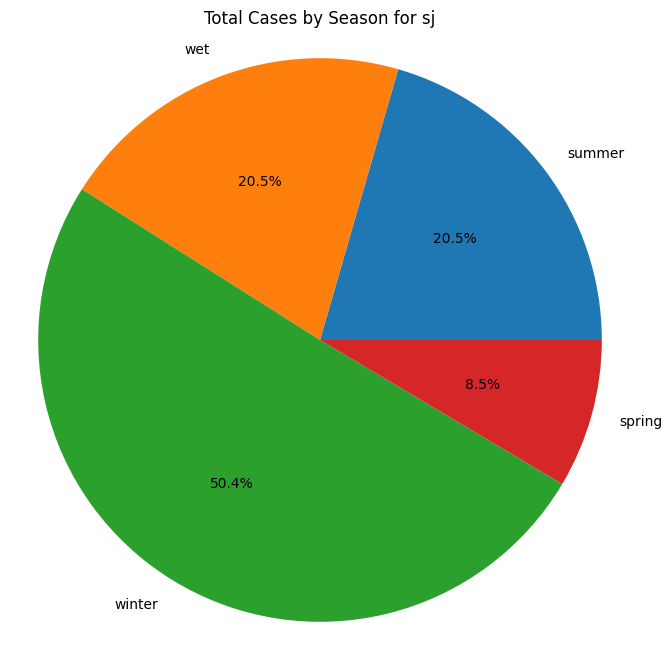

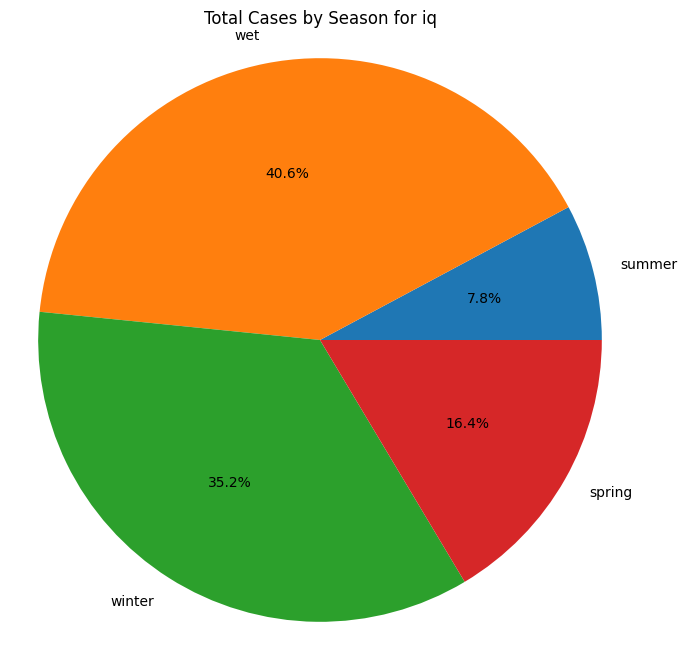

In [16]:
seasons = {'summer': [24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35],
           'wet': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23],
           'winter': [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52],
           'spring': [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]}

for city in feat_train['city'].unique():
    city_df = feat_train[feat_train['city'] == city]

    season_totals = {}
    for season, weeks in seasons.items():
        season_totals[season] = city_df[city_df['weekofyear'].isin(weeks)]['total_cases'].sum()

    plt.figure(figsize=(8, 8))
    plt.pie(season_totals.values(), labels=season_totals.keys(), autopct='%1.1f%%')
    plt.title(f'Total Cases by Season for {city}')
    plt.axis('equal')
    plt.show()

In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1199 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1199 non-null   object 
 1   year                                   1199 non-null   int64  
 2   weekofyear                             1199 non-null   int64  
 3   week_start_date                        1199 non-null   object 
 4   ndvi_ne                                1199 non-null   float64
 5   ndvi_nw                                1199 non-null   float64
 6   ndvi_se                                1199 non-null   float64
 7   ndvi_sw                                1199 non-null   float64
 8   precipitation_amt_mm                   1199 non-null   float64
 9   reanalysis_air_temp_k                  1199 non-null   float64
 10  reanalysis_avg_temp_k                  1199 non-null   float64
 11  reanalysi

In [18]:
train['city'] = train['city'].astype('category')

In [19]:
train['week_start_date'] = pd.to_datetime(train['week_start_date'])

In [20]:
merged_df = pd.merge(train, feat_train[['city', 'year', 'weekofyear', 'total_cases']], on=['city', 'year', 'weekofyear'], how='left')

In [21]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199 entries, 0 to 1198
Data columns (total 25 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   city                                   1199 non-null   object        
 1   year                                   1199 non-null   int64         
 2   weekofyear                             1199 non-null   int64         
 3   week_start_date                        1199 non-null   datetime64[ns]
 4   ndvi_ne                                1199 non-null   float64       
 5   ndvi_nw                                1199 non-null   float64       
 6   ndvi_se                                1199 non-null   float64       
 7   ndvi_sw                                1199 non-null   float64       
 8   precipitation_amt_mm                   1199 non-null   float64       
 9   reanalysis_air_temp_k                  1199 non-null   float64 

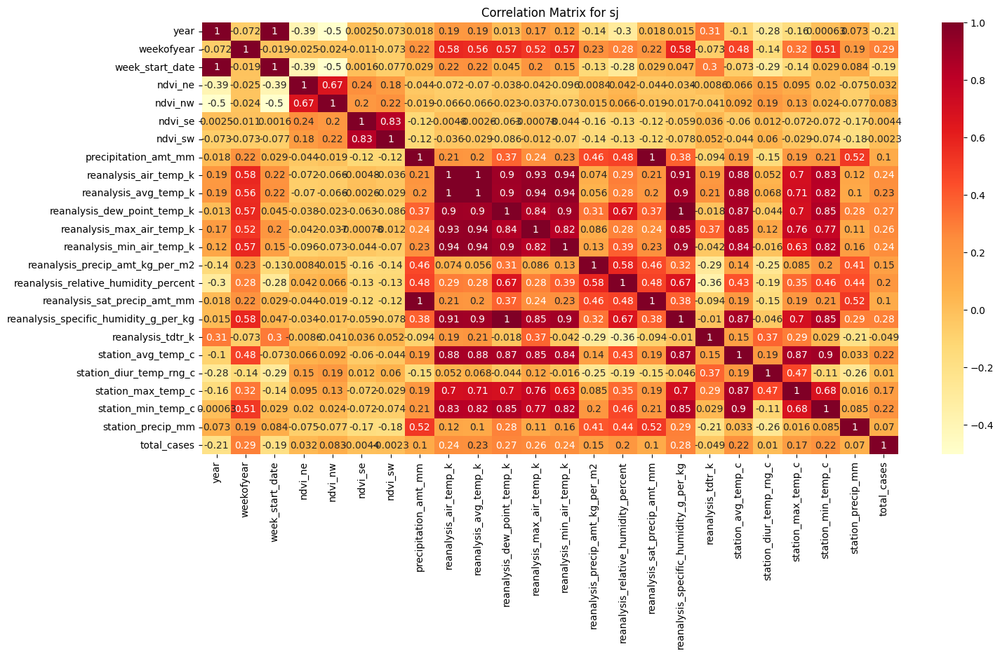

In [22]:
city = 'sj'

city_df = merged_df[merged_df['city'] == city]
city_df_for_corr = city_df.drop('city', axis=1)
city_corr = city_df_for_corr.corr()

plt.figure(figsize=(16, 8))
plt.title(f'Correlation Matrix for {city}')
sns.heatmap(city_corr, annot=True, cmap='YlOrRd')
plt.show()

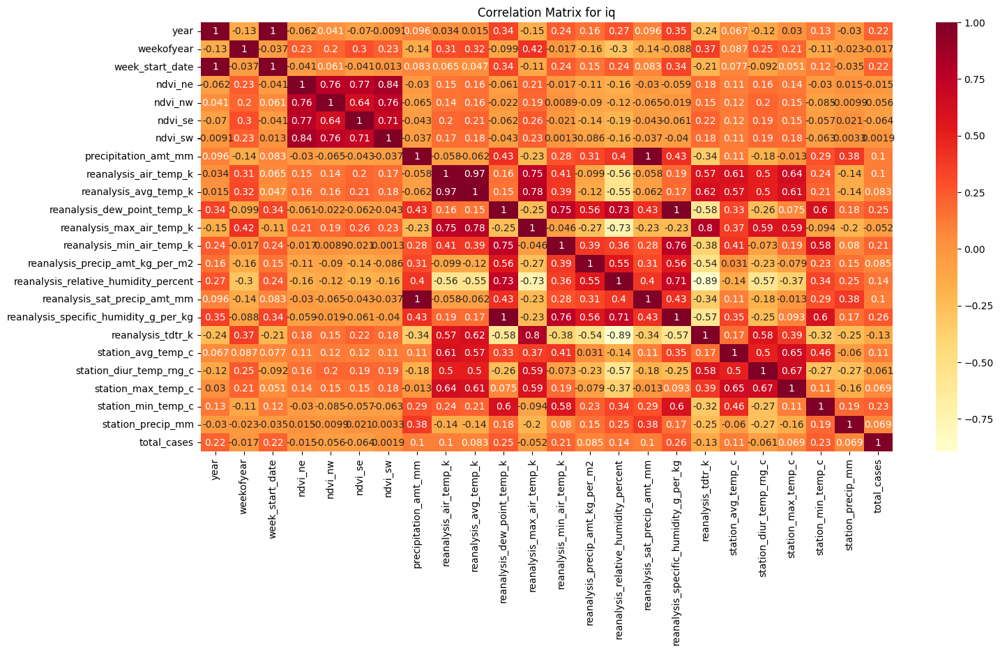

In [23]:
city = 'iq'

city_df = merged_df[merged_df['city'] == city]
city_df_for_corr = city_df.drop('city', axis=1)
city_corr = city_df_for_corr.corr()

plt.figure(figsize=(16, 8))
plt.title(f'Correlation Matrix for {city}')
sns.heatmap(city_corr, annot=True, cmap='YlOrRd')
plt.show()

In [24]:
train.isnull().sum()

city                                     0
year                                     0
weekofyear                               0
week_start_date                          0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

In [25]:
test.isnull().sum()

city                                      0
year                                      0
weekofyear                                0
week_start_date                           0
ndvi_ne                                  43
ndvi_nw                                  11
ndvi_se                                   1
ndvi_sw                                   1
precipitation_amt_mm                      2
reanalysis_air_temp_k                     2
reanalysis_avg_temp_k                     2
reanalysis_dew_point_temp_k               2
reanalysis_max_air_temp_k                 2
reanalysis_min_air_temp_k                 2
reanalysis_precip_amt_kg_per_m2           2
reanalysis_relative_humidity_percent      2
reanalysis_sat_precip_amt_mm              2
reanalysis_specific_humidity_g_per_kg     2
reanalysis_tdtr_k                         2
station_avg_temp_c                       12
station_diur_temp_rng_c                  12
station_max_temp_c                        3
station_min_temp_c              

In [26]:
# test.fillna(0, inplace=True)
test=test.dropna()

In [27]:
import matplotlib.pyplot as plt

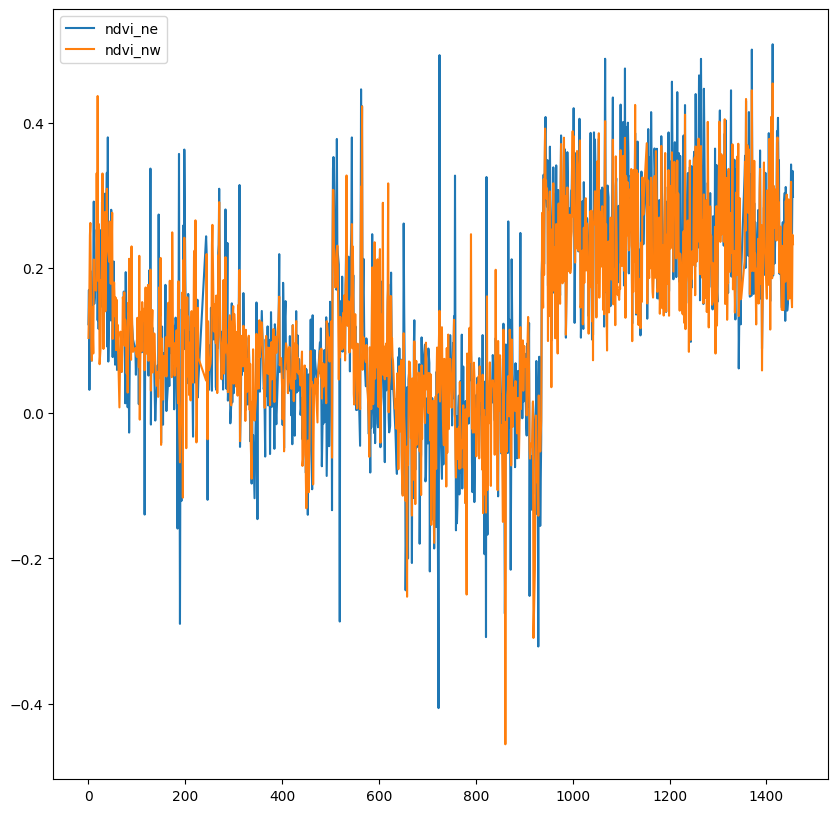

In [28]:
plt.figure(figsize=(10,10))
train['ndvi_ne'].plot()
train['ndvi_nw'].plot()
plt.legend()

In [29]:
df=pd.merge(train, feat_train)

In [30]:
df.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6


In [31]:
c1 = df[df['city'] == 'sj']

In [32]:
c1.shape

(727, 25)

In [33]:
c2 = df[df['city'] == 'iq']

In [34]:
c2.shape

(472, 25)

In [35]:
c1['week_start_date']=pd.to_datetime(c1['week_start_date'])

<ipython-input-35-745172b1c249>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c1['week_start_date']=pd.to_datetime(c1['week_start_date'])


In [36]:
c1.dtypes

city                                             object
year                                              int64
weekofyear                                        int64
week_start_date                          datetime64[ns]
ndvi_ne                                         float64
ndvi_nw                                         float64
ndvi_se                                         float64
ndvi_sw                                         float64
precipitation_amt_mm                            float64
reanalysis_air_temp_k                           float64
reanalysis_avg_temp_k                           float64
reanalysis_dew_point_temp_k                     float64
reanalysis_max_air_temp_k                       float64
reanalysis_min_air_temp_k                       float64
reanalysis_precip_amt_kg_per_m2                 float64
reanalysis_relative_humidity_percent            float64
reanalysis_sat_precip_amt_mm                    float64
reanalysis_specific_humidity_g_per_kg           

In [37]:
%timeit pd.to_datetime(c1['week_start_date'], infer_datetime_format=True)

Streaming output truncated to the last 5000 lines.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a

1.32 ms ± 327 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the 

In [38]:
c1.dtypes

city                                             object
year                                              int64
weekofyear                                        int64
week_start_date                          datetime64[ns]
ndvi_ne                                         float64
ndvi_nw                                         float64
ndvi_se                                         float64
ndvi_sw                                         float64
precipitation_amt_mm                            float64
reanalysis_air_temp_k                           float64
reanalysis_avg_temp_k                           float64
reanalysis_dew_point_temp_k                     float64
reanalysis_max_air_temp_k                       float64
reanalysis_min_air_temp_k                       float64
reanalysis_precip_amt_kg_per_m2                 float64
reanalysis_relative_humidity_percent            float64
reanalysis_sat_precip_amt_mm                    float64
reanalysis_specific_humidity_g_per_kg           

In [39]:
c1.set_index(c1['week_start_date'], inplace=True)

In [40]:
c1.shape

(727, 25)

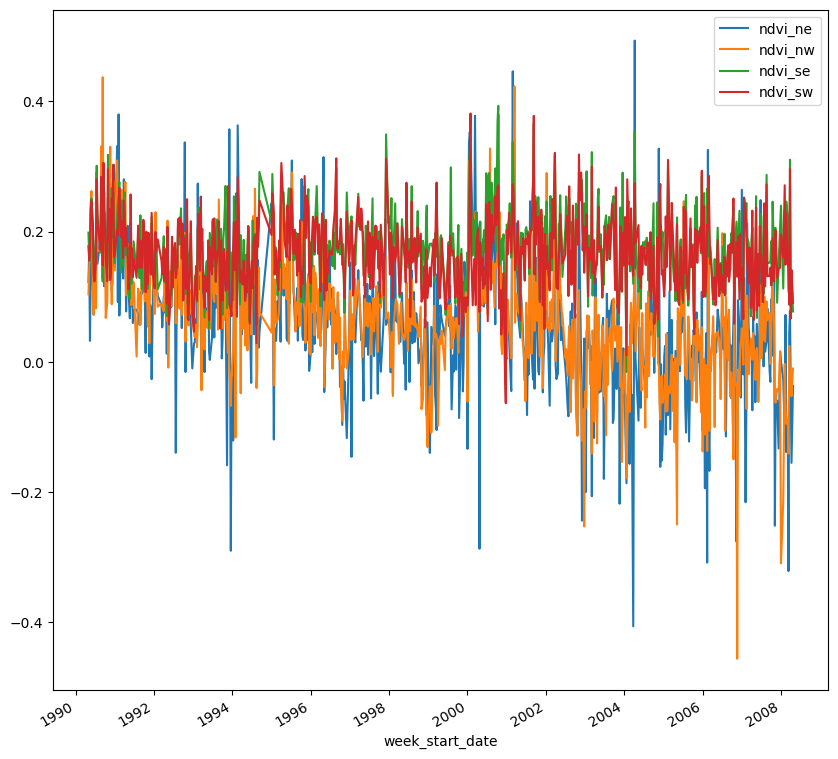

In [41]:
plt.figure(figsize=(10,10))
c1['ndvi_ne'].plot()
c1['ndvi_nw'].plot()
c1['ndvi_se'].plot()
c1['ndvi_sw'].plot()
plt.legend()
plt.show()

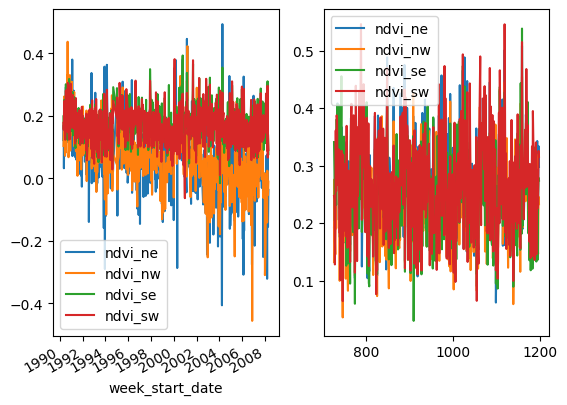

In [42]:
plt.subplot(1,2,1)
c1['ndvi_ne'].plot()
c1['ndvi_nw'].plot()
c1['ndvi_se'].plot()
c1['ndvi_sw'].plot()
plt.legend()
plt.subplot(1,2,2)
c2['ndvi_ne'].plot()
c2['ndvi_nw'].plot()
c2['ndvi_se'].plot()
c2['ndvi_sw'].plot()
plt.legend()

In [43]:
%timeit pd.to_datetime(df['week_start_date'], infer_datetime_format=True)

Streaming output truncated to the last 5000 lines.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a

1.69 ms ± 380 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
<magic-timeit>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the 

In [44]:
c2['week_start_date']=pd.to_datetime(c2['week_start_date'])

<ipython-input-44-bd2483852b03>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c2['week_start_date']=pd.to_datetime(c2['week_start_date'])


In [45]:
c2.set_index(c2['week_start_date'], inplace=True)

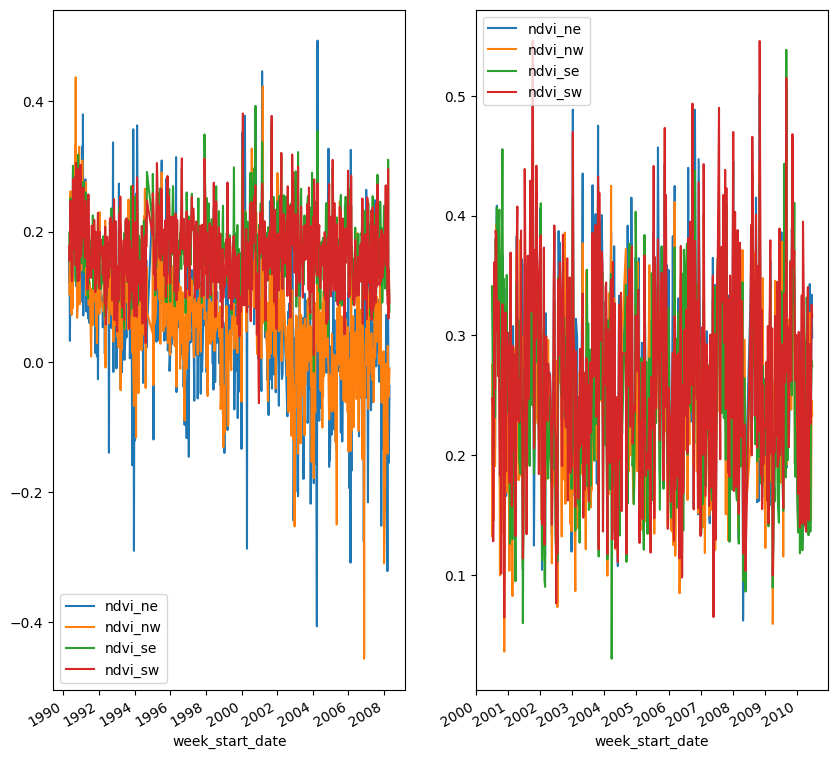

In [46]:
plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
c1['ndvi_ne'].plot()
c1['ndvi_nw'].plot()
c1['ndvi_se'].plot()
c1['ndvi_sw'].plot()
plt.legend()
plt.subplot(1,2,2)
c2['ndvi_ne'].plot()
c2['ndvi_nw'].plot()
c2['ndvi_se'].plot()
c2['ndvi_sw'].plot()
plt.legend()

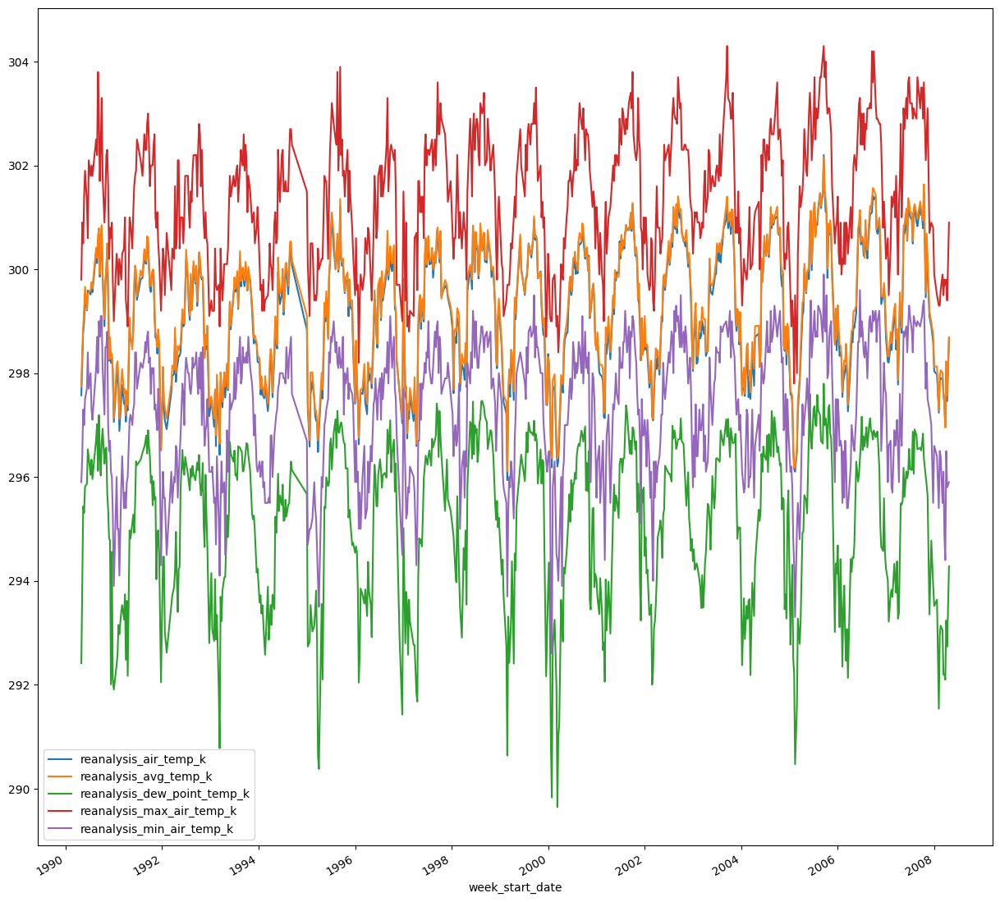

In [47]:
plt.figure(figsize=(15,15))
c1['reanalysis_air_temp_k'].plot()
c1['reanalysis_avg_temp_k'].plot()
c1['reanalysis_dew_point_temp_k'].plot()
c1['reanalysis_max_air_temp_k'].plot()
c1['reanalysis_min_air_temp_k'].plot()
plt.legend()

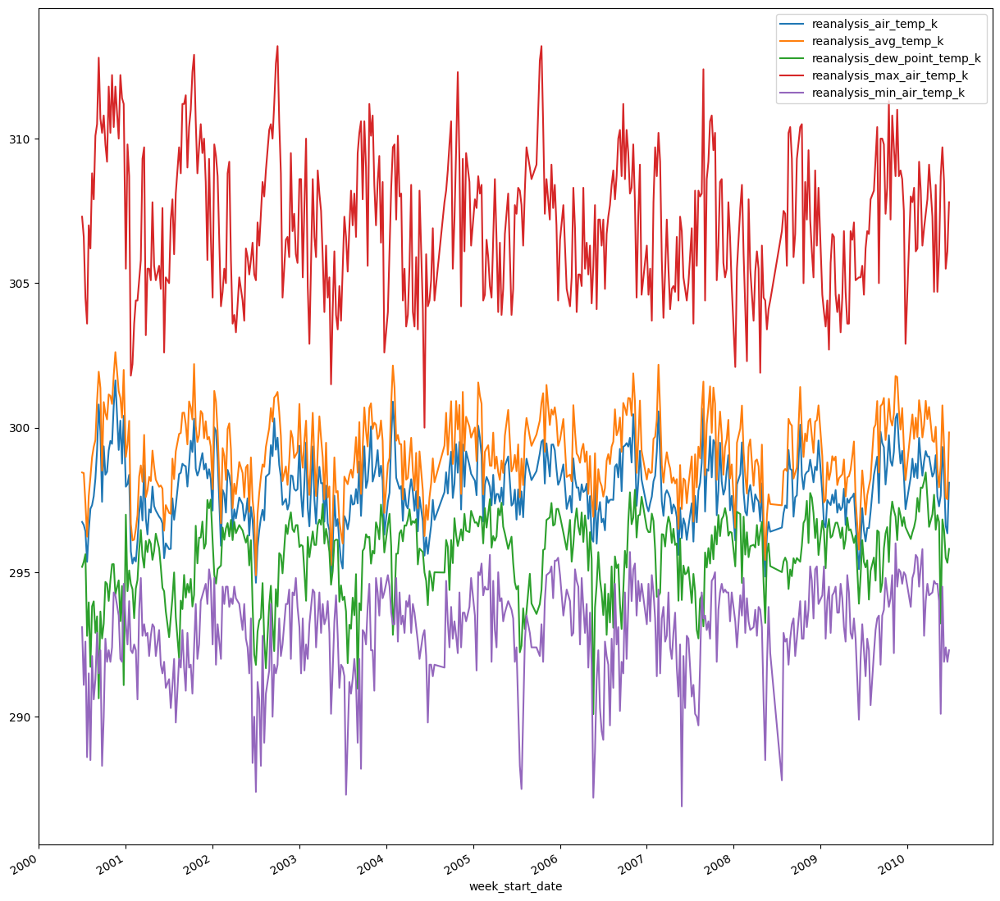

In [48]:
plt.figure(figsize=(15,15))
c2['reanalysis_air_temp_k'].plot()
c2['reanalysis_avg_temp_k'].plot()
c2['reanalysis_dew_point_temp_k'].plot()
c2['reanalysis_max_air_temp_k'].plot()
c2['reanalysis_min_air_temp_k'].plot()
plt.legend()

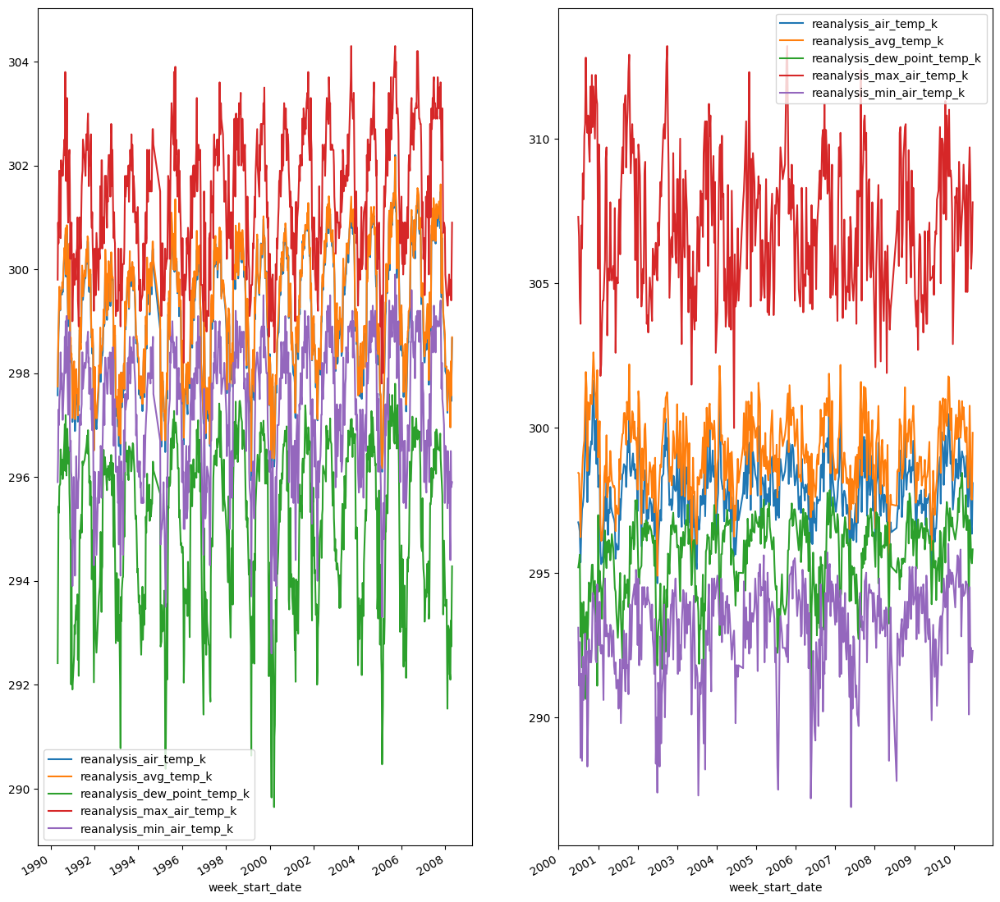

In [49]:
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
c1['reanalysis_air_temp_k'].plot()
c1['reanalysis_avg_temp_k'].plot()
c1['reanalysis_dew_point_temp_k'].plot()
c1['reanalysis_max_air_temp_k'].plot()
c1['reanalysis_min_air_temp_k'].plot()
plt.legend()
plt.subplot(1,2,2)
c2['reanalysis_air_temp_k'].plot()
c2['reanalysis_avg_temp_k'].plot()
c2['reanalysis_dew_point_temp_k'].plot()
c2['reanalysis_max_air_temp_k'].plot()
c2['reanalysis_min_air_temp_k'].plot()
plt.legend()

In [50]:
df.dtypes

city                                             object
year                                              int64
weekofyear                                        int64
week_start_date                          datetime64[ns]
ndvi_ne                                         float64
ndvi_nw                                         float64
ndvi_se                                         float64
ndvi_sw                                         float64
precipitation_amt_mm                            float64
reanalysis_air_temp_k                           float64
reanalysis_avg_temp_k                           float64
reanalysis_dew_point_temp_k                     float64
reanalysis_max_air_temp_k                       float64
reanalysis_min_air_temp_k                       float64
reanalysis_precip_amt_kg_per_m2                 float64
reanalysis_relative_humidity_percent            float64
reanalysis_sat_precip_amt_mm                    float64
reanalysis_specific_humidity_g_per_kg           

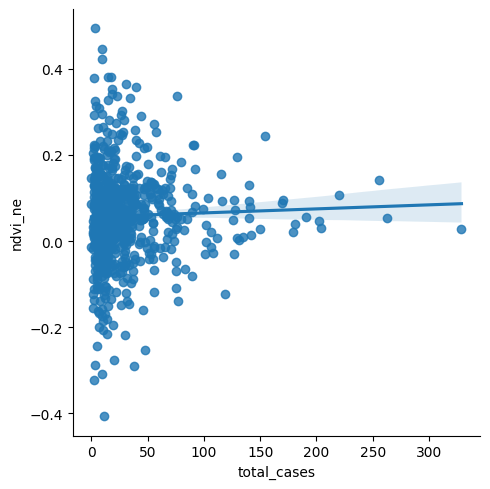

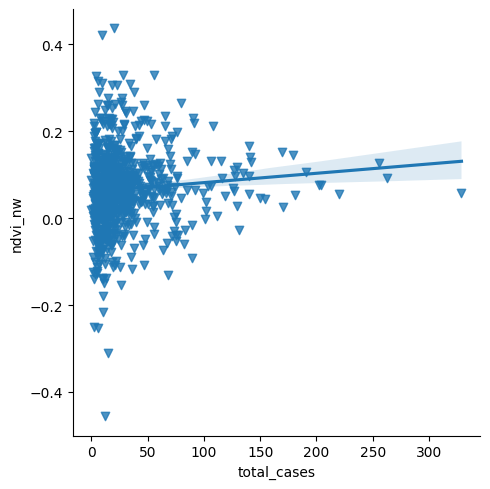

In [51]:
g=sns.lmplot(x='total_cases', y='ndvi_ne', data=c1, markers='o')
g=sns.lmplot(x='total_cases', y='ndvi_nw', data=c1, markers='v')

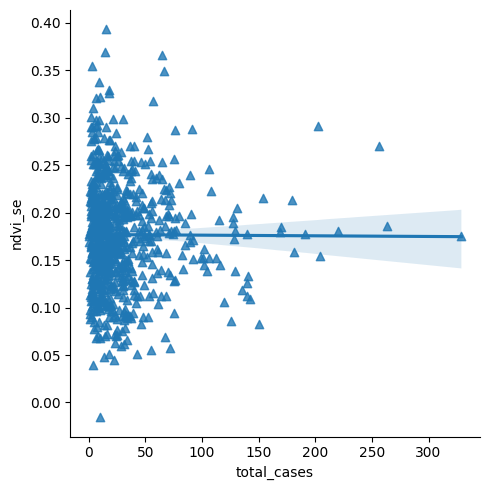

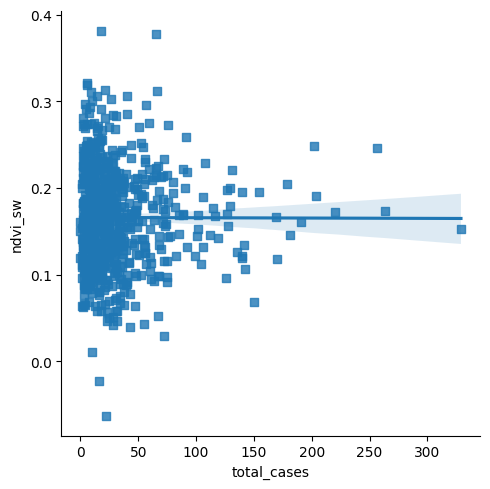

In [52]:
g=sns.lmplot(x='total_cases', y='ndvi_se', data=c1, markers='^')
g=sns.lmplot(x='total_cases', y='ndvi_sw', data=c1, markers='s')

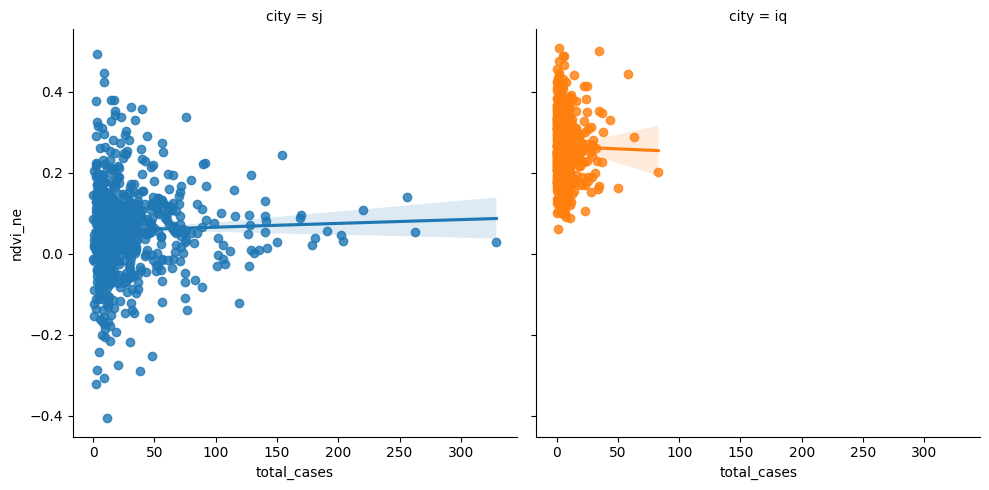

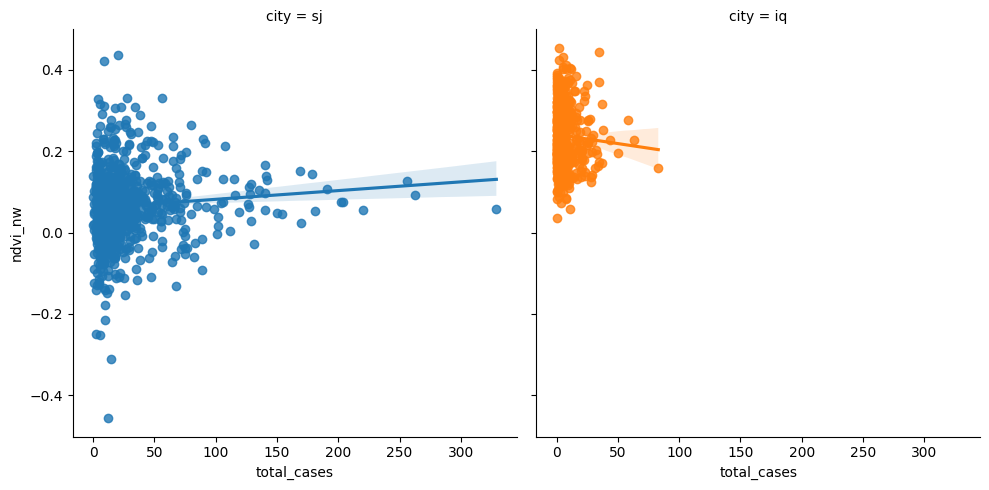

In [53]:
g=sns.lmplot(x='total_cases', y='ndvi_ne', data=df, markers='o', col='city',
             hue='city')
g=sns.lmplot(x='total_cases', y='ndvi_nw', data=df, markers='o', col='city',
             hue='city')

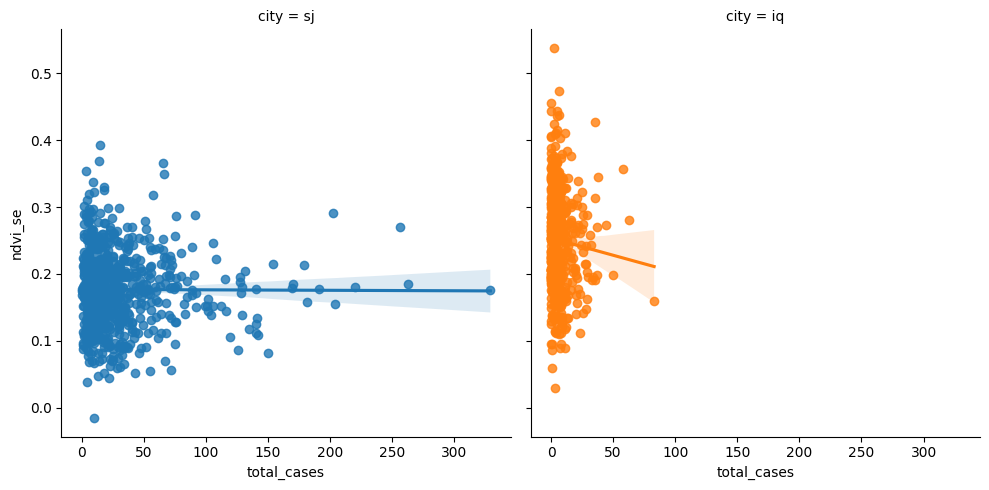

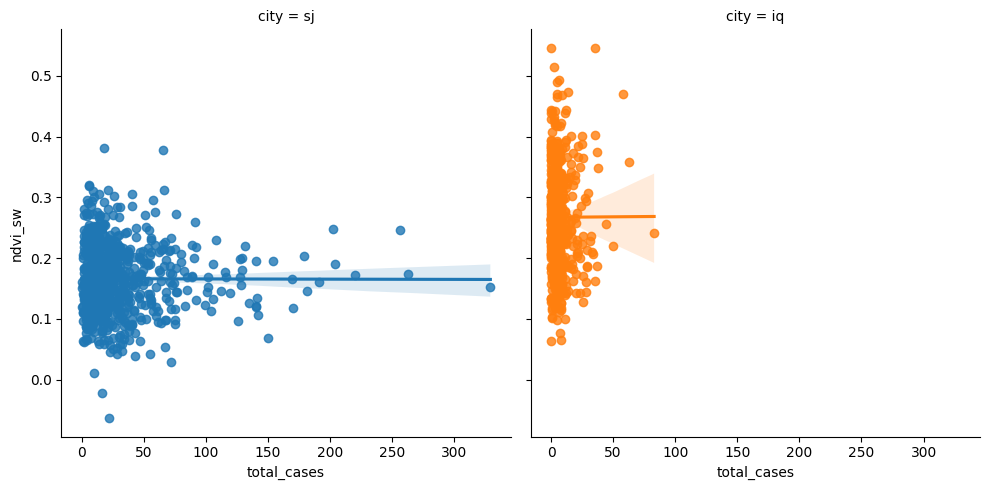

In [54]:
g=sns.lmplot(x='total_cases', y='ndvi_se', data=df, markers='o', col='city',
             hue='city')
g=sns.lmplot(x='total_cases', y='ndvi_sw', data=df, markers='o', col='city',
             hue='city')

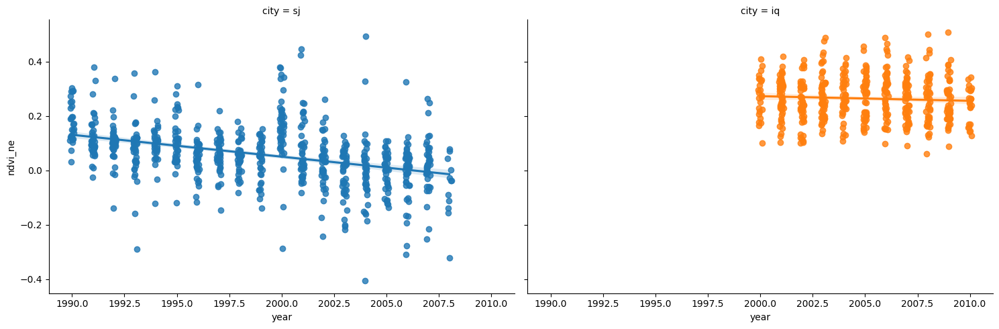

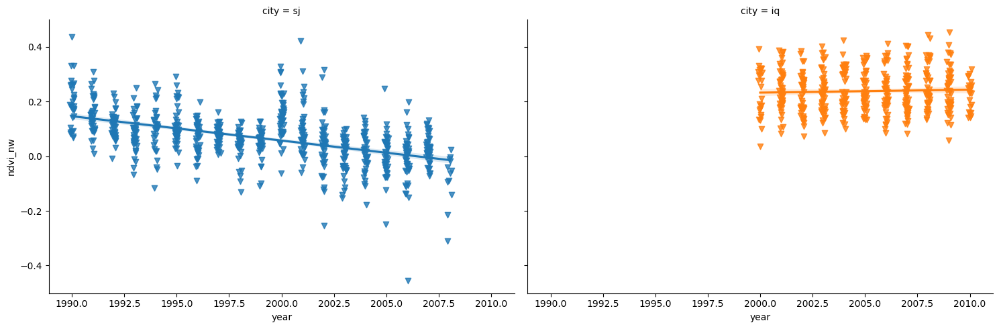

In [55]:
g=sns.lmplot(x='year', y='ndvi_ne', data=df, markers='o', col='city',
             hue='city', aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='ndvi_nw', data=df, markers='v', col='city',
             hue='city', aspect=1.5, x_jitter=.1)

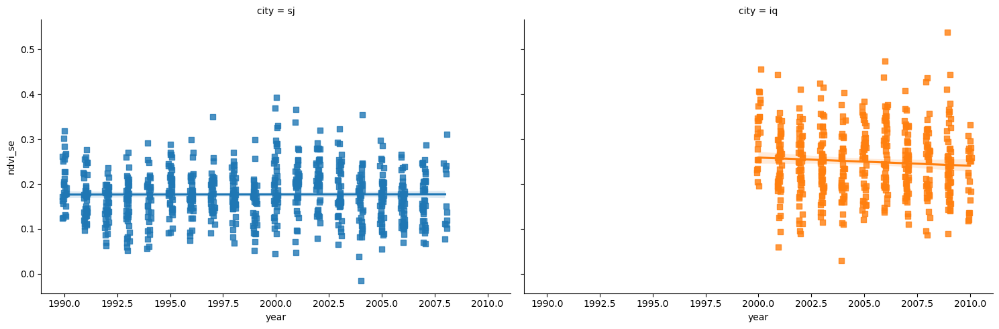

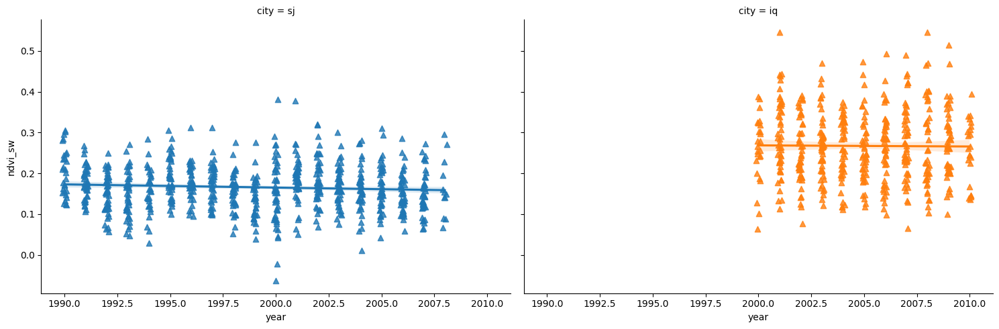

In [56]:
g=sns.lmplot(x='year', y='ndvi_se', data=df, markers='s', col='city',
             hue='city', aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year',  y='ndvi_sw', data=df, markers='^', col='city',
             hue='city', aspect=1.5, x_jitter=.1)

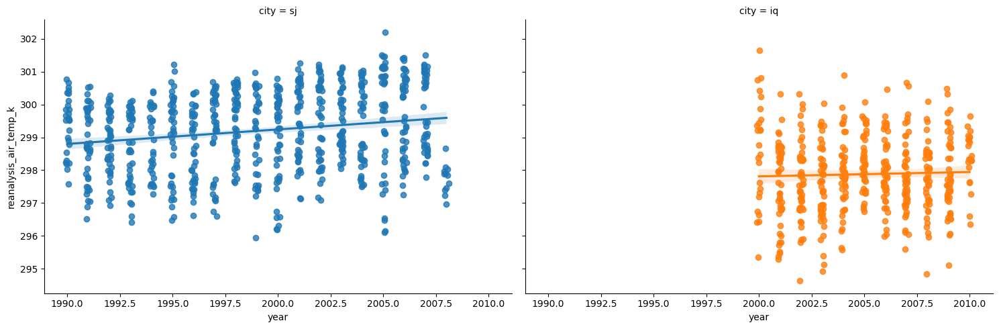

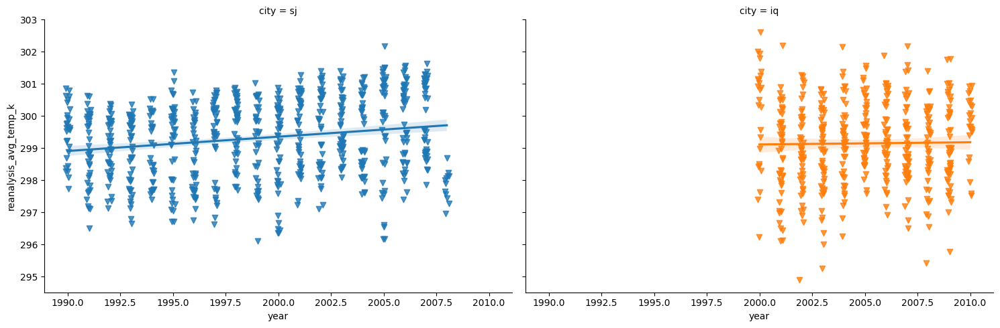

In [57]:
g=sns.lmplot(x='year', y='reanalysis_air_temp_k', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='reanalysis_avg_temp_k', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

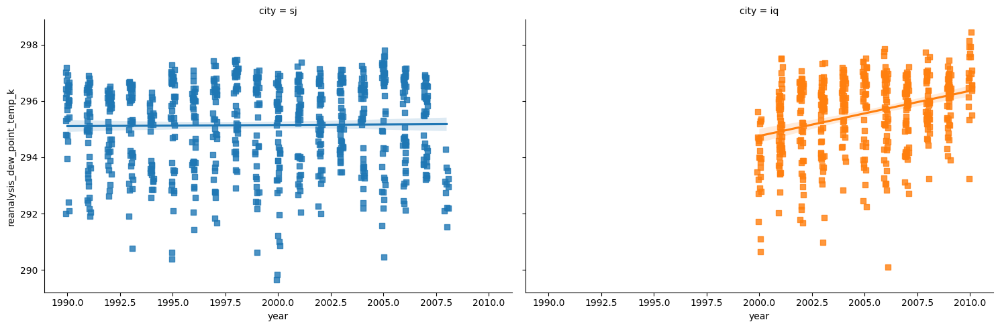

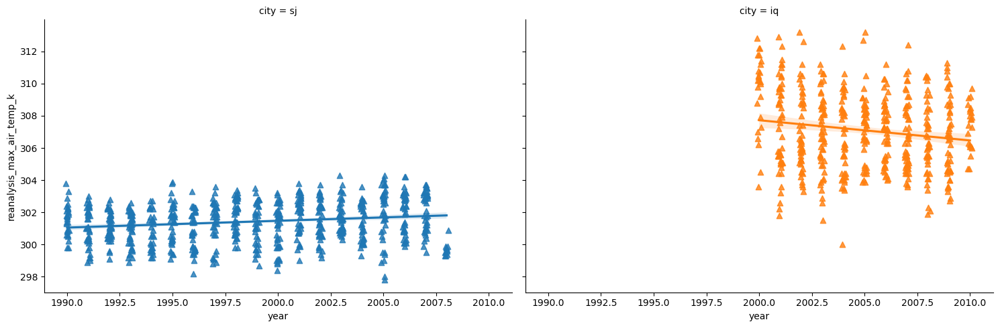

In [58]:
g=sns.lmplot(x='year', y='reanalysis_dew_point_temp_k', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='reanalysis_max_air_temp_k', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

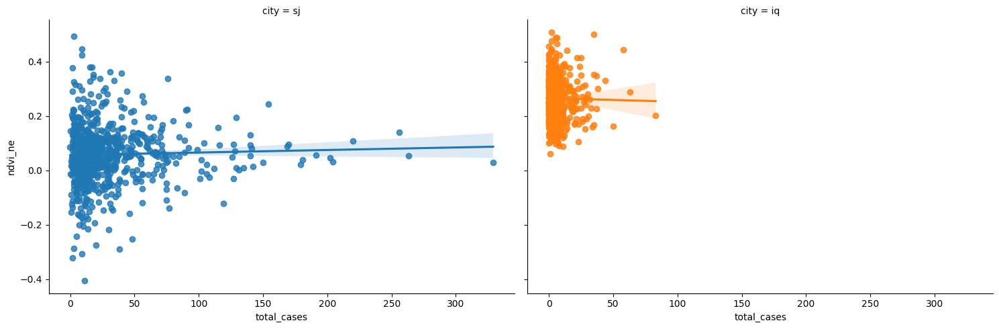

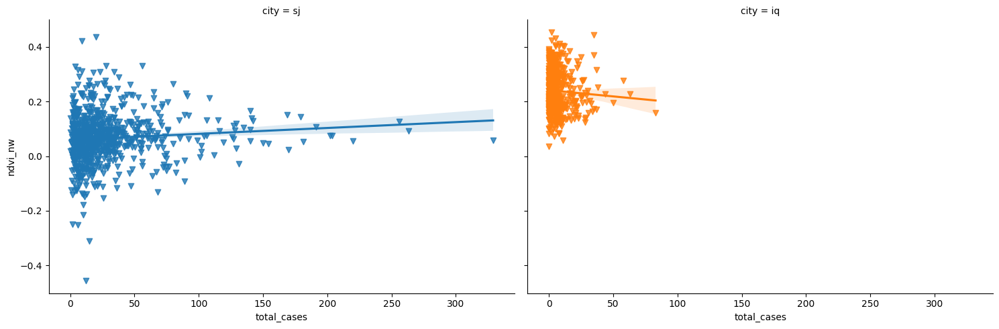

In [59]:
g=sns.lmplot(x='total_cases', y='ndvi_ne', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='ndvi_nw', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

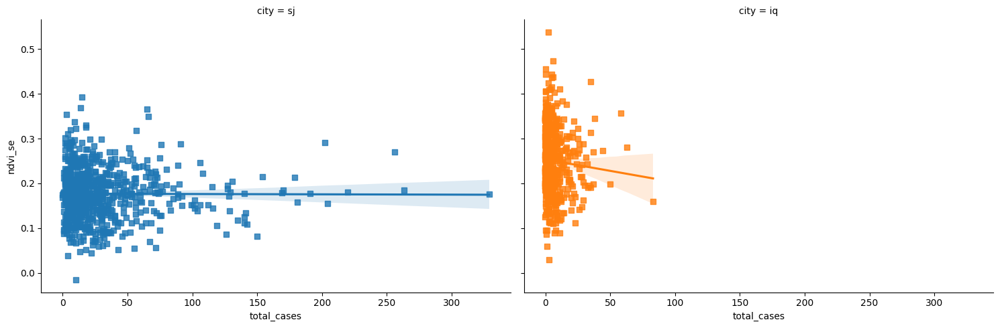

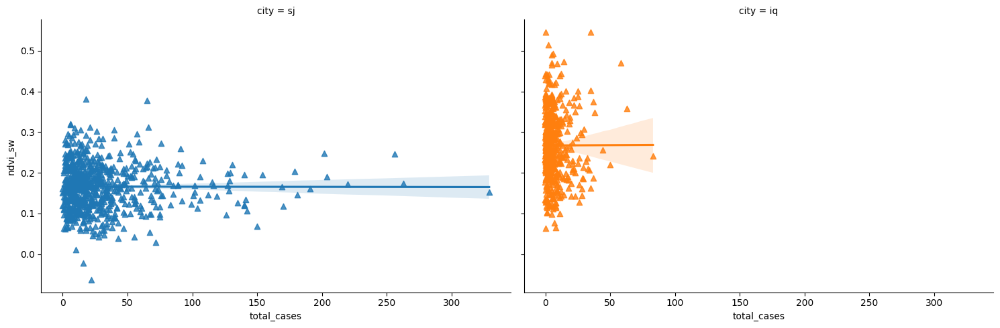

In [60]:
g=sns.lmplot(x='total_cases', y='ndvi_se', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='ndvi_sw', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

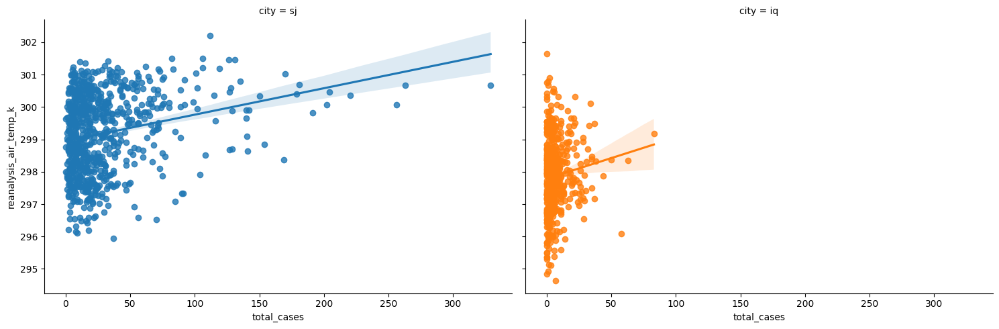

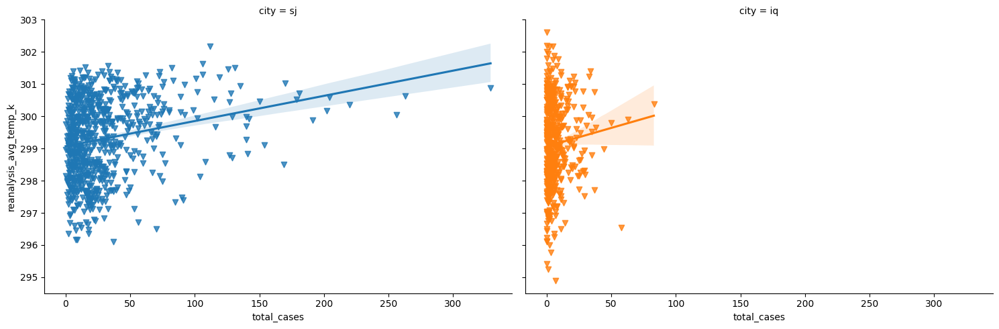

In [61]:
g=sns.lmplot(x='total_cases', y='reanalysis_air_temp_k', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_avg_temp_k', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

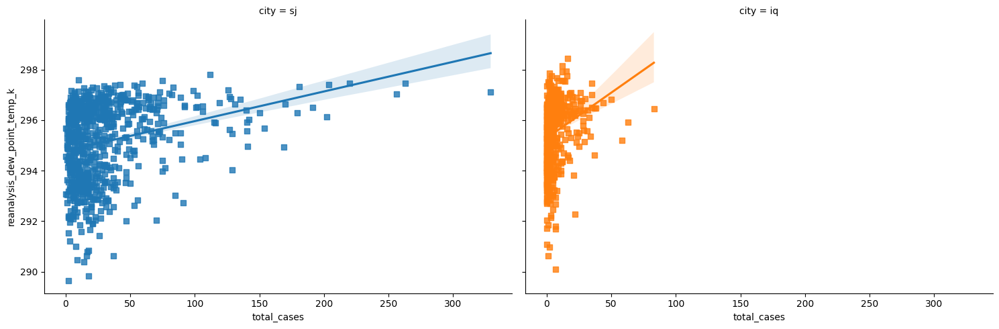

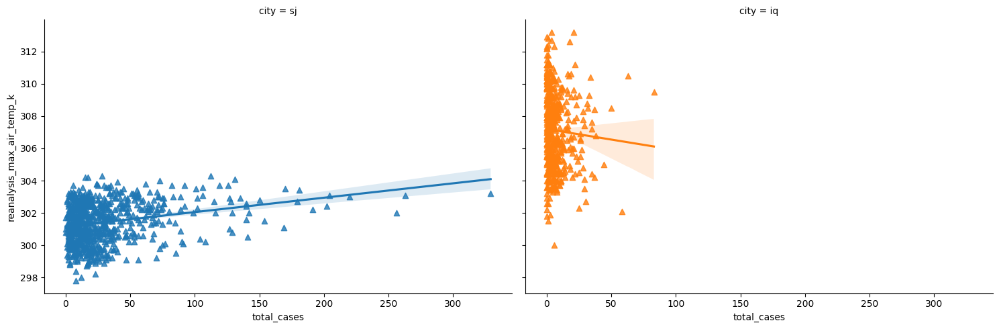

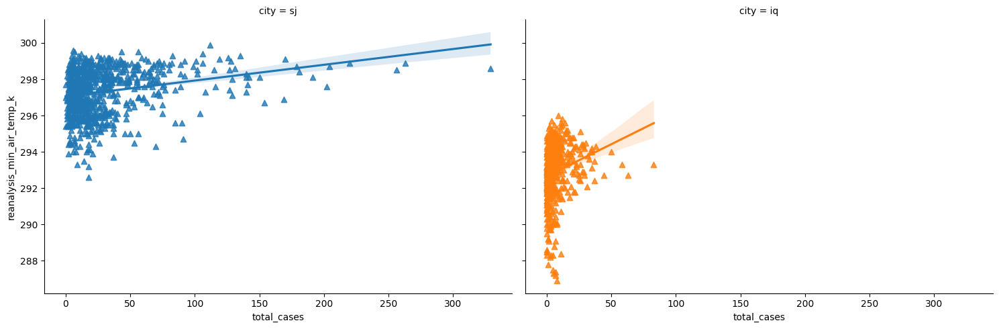

In [62]:
g=sns.lmplot(x='total_cases', y='reanalysis_dew_point_temp_k', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_max_air_temp_k', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_min_air_temp_k', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

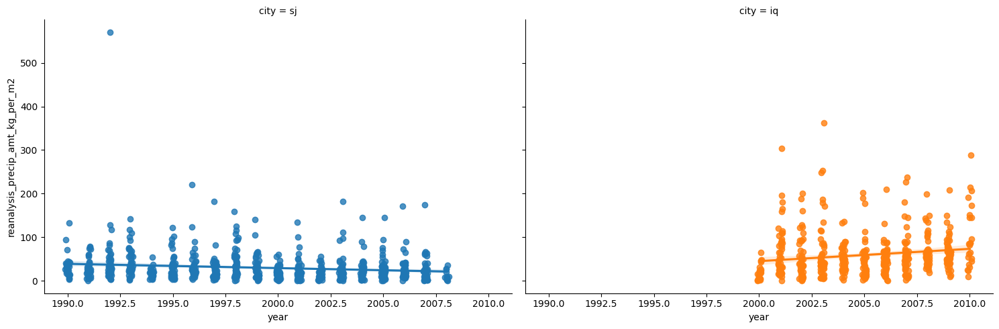

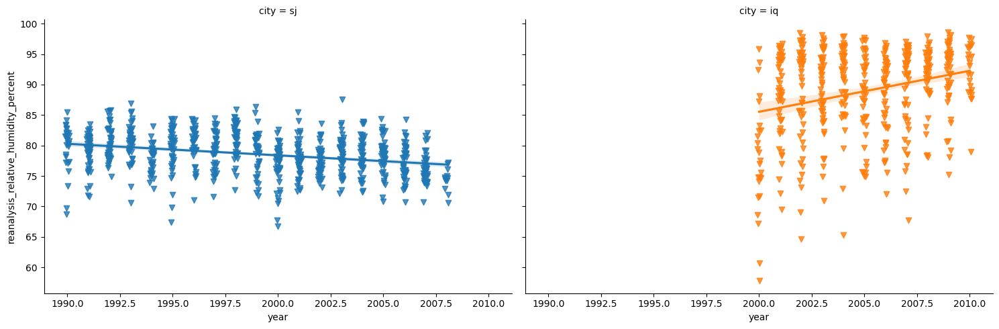

In [63]:
g=sns.lmplot(x='year', y='reanalysis_precip_amt_kg_per_m2', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='reanalysis_relative_humidity_percent', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

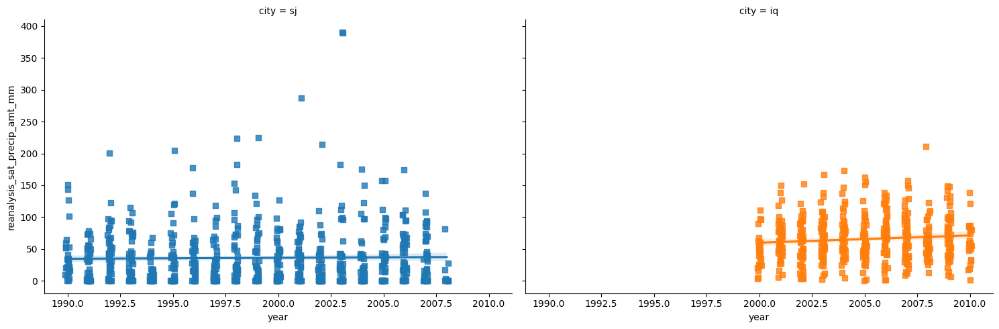

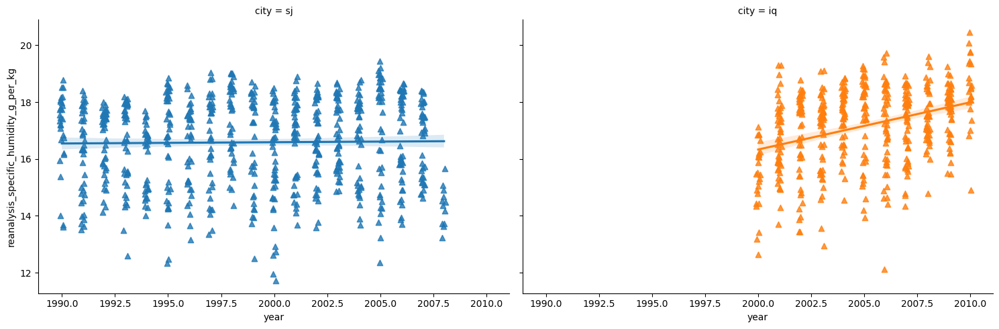

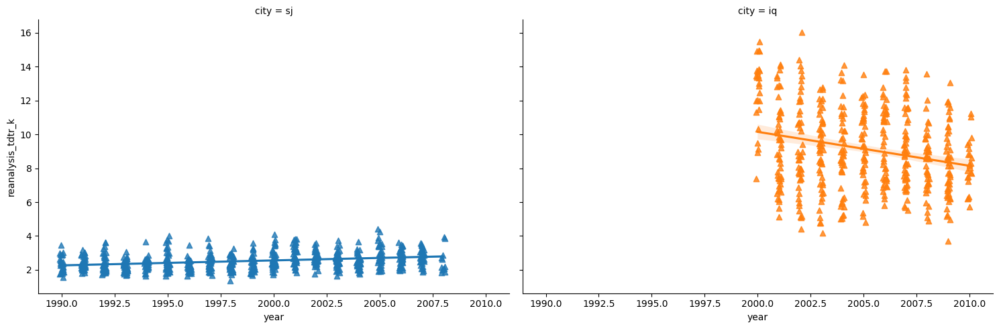

In [64]:
g=sns.lmplot(x='year', y='reanalysis_sat_precip_amt_mm', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='reanalysis_specific_humidity_g_per_kg', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='reanalysis_tdtr_k', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

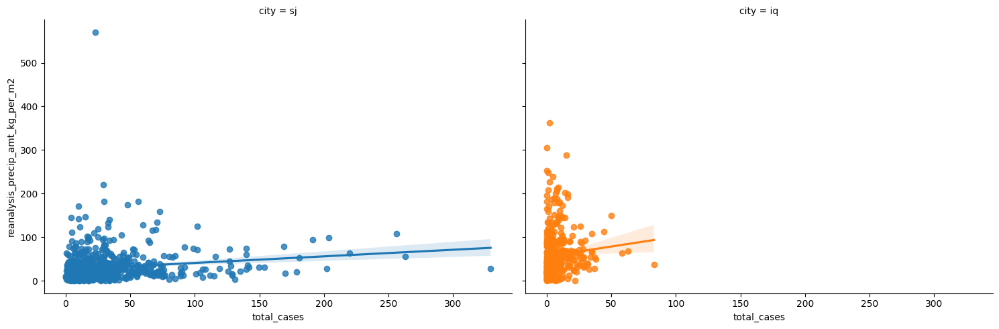

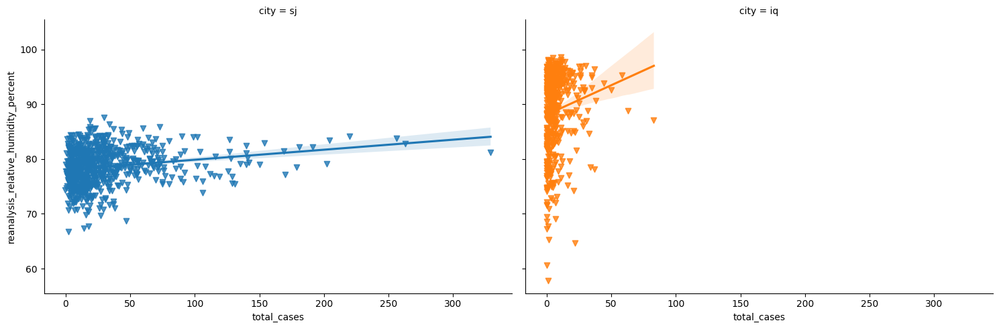

In [65]:
g=sns.lmplot(x='total_cases', y='reanalysis_precip_amt_kg_per_m2', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_relative_humidity_percent', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

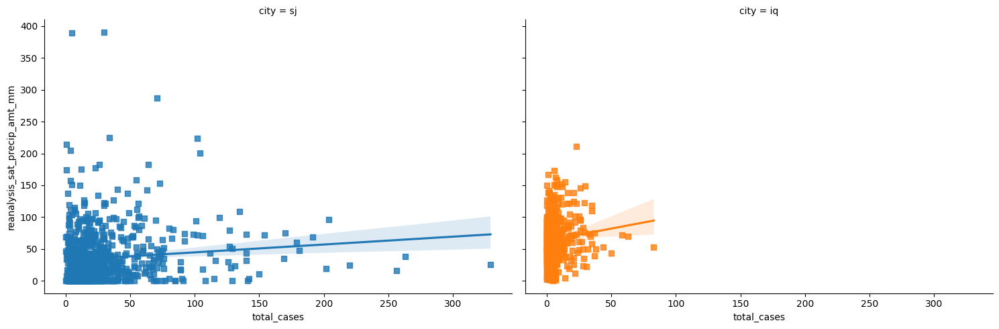

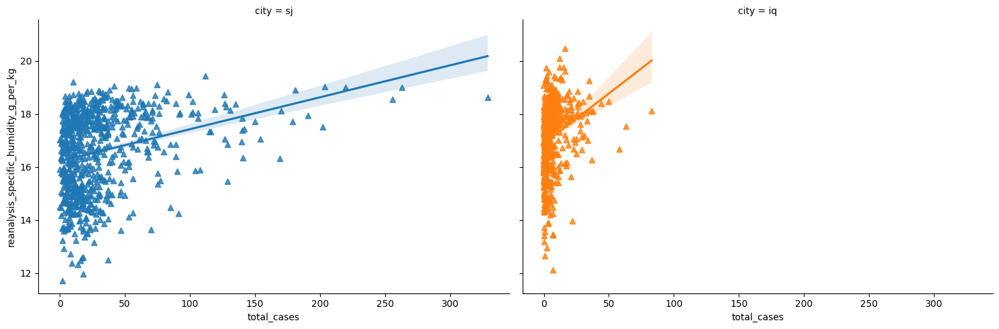

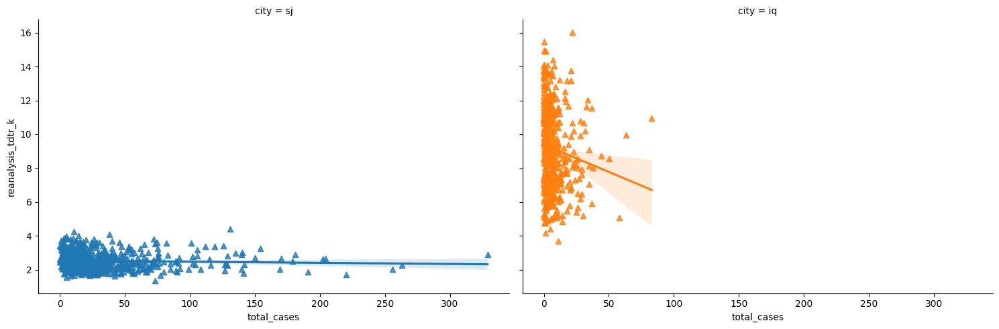

In [66]:
g=sns.lmplot(x='total_cases', y='reanalysis_sat_precip_amt_mm', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_specific_humidity_g_per_kg', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='reanalysis_tdtr_k', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

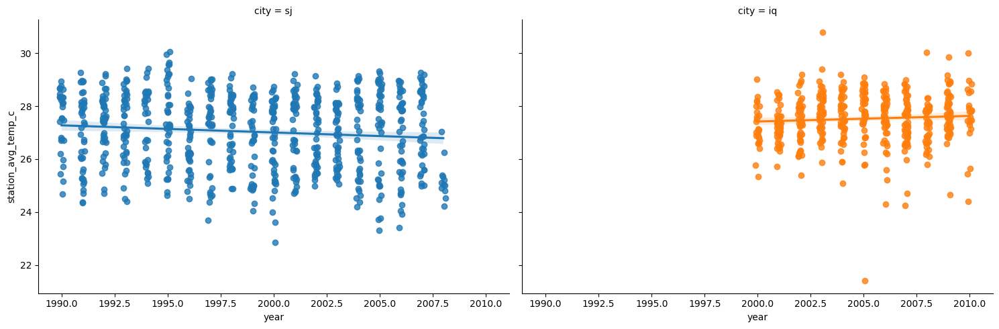

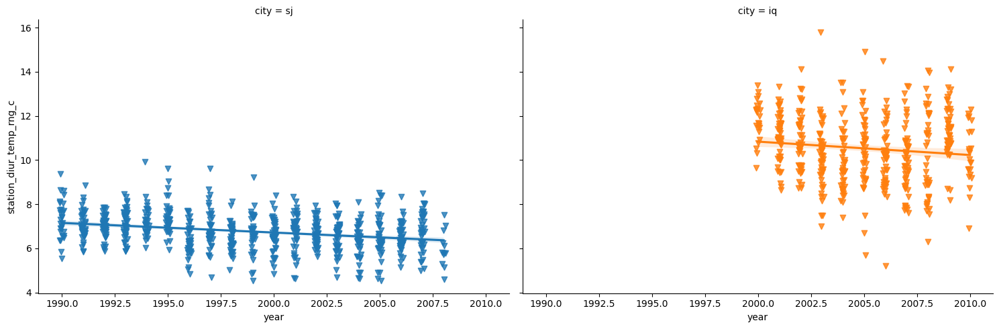

In [67]:
g=sns.lmplot(x='year', y='station_avg_temp_c', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='station_diur_temp_rng_c', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

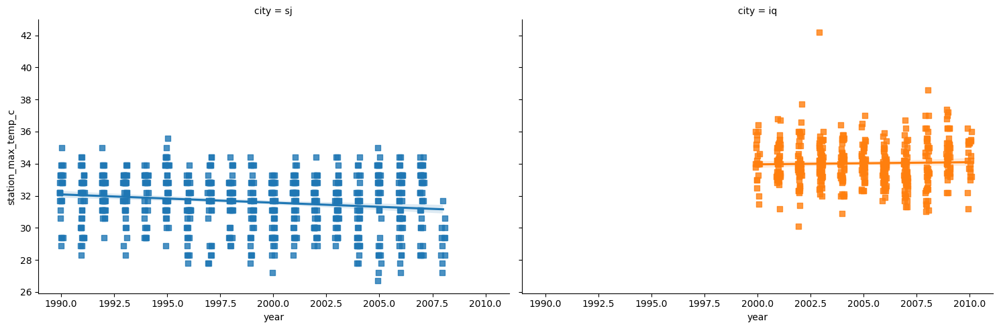

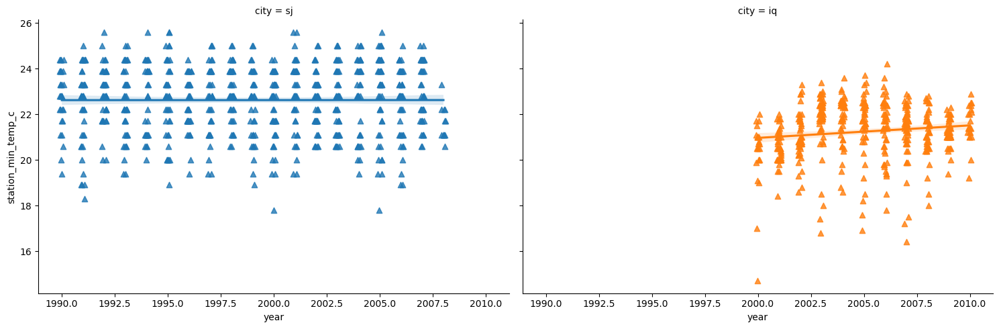

In [68]:
g=sns.lmplot(x='year', y='station_max_temp_c', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='year', y='station_min_temp_c', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

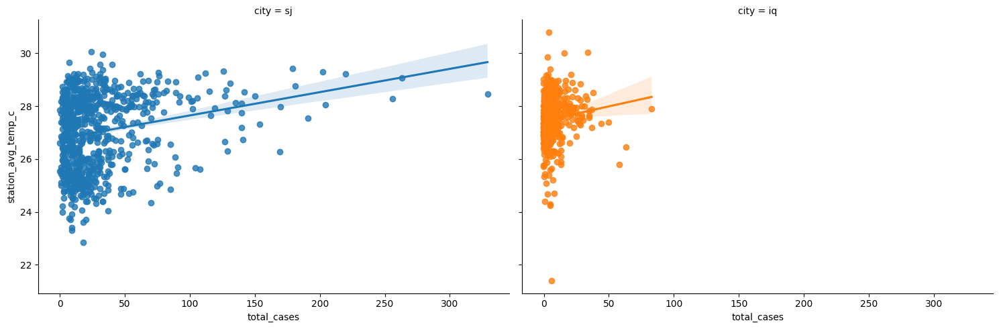

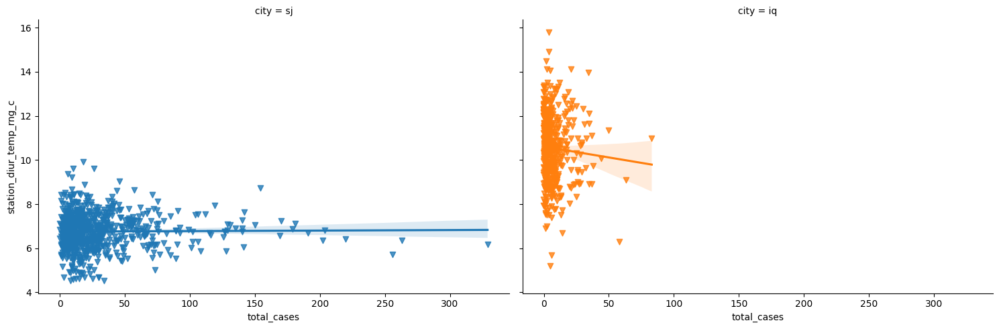

In [69]:
g=sns.lmplot(x='total_cases', y='station_avg_temp_c', data=df, markers='o', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='station_diur_temp_rng_c', data=df, markers='v', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

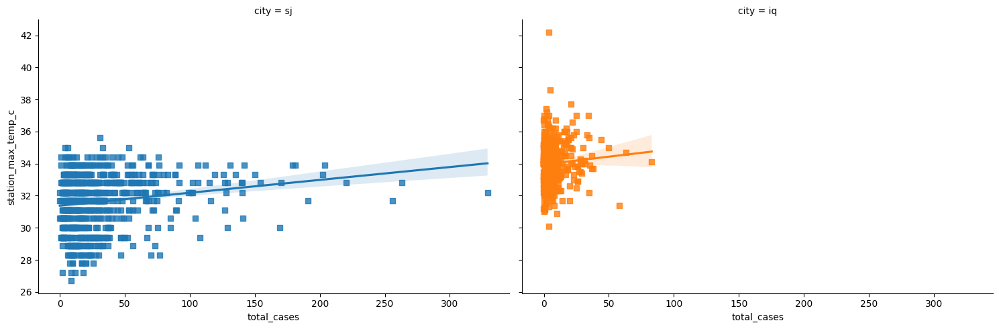

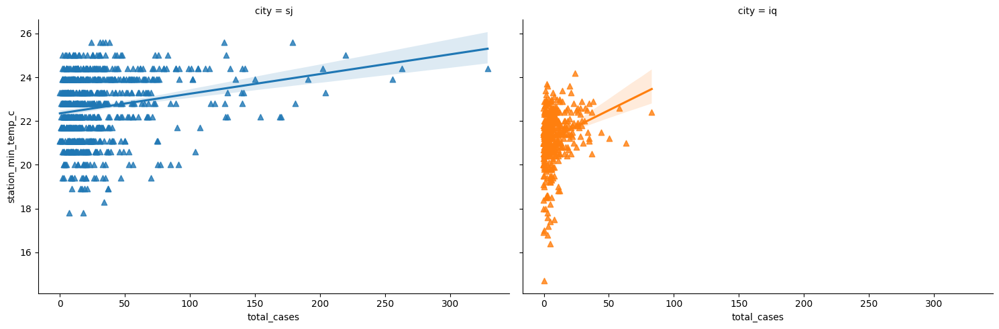

In [70]:
g=sns.lmplot(x='total_cases', y='station_max_temp_c', data=df, markers='s', col='city',
             hue='city',aspect=1.5, x_jitter=.1)
g=sns.lmplot(x='total_cases', y='station_min_temp_c', data=df, markers='^', col='city',
             hue='city',aspect=1.5, x_jitter=.1)

In [71]:
feature_col=['city','week_start_date','total_cases','weekofyear']
X=df.drop(feature_col, axis=1)

In [72]:
X.shape

(1199, 21)

In [73]:
y=df.iloc[:,24]

In [74]:
y.shape

(1199,)

In [75]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [76]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)

In [90]:
clf=KNeighborsClassifier(n_neighbors=13)
scoring='accuracy'
score=cross_val_score(clf, X, y, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)

[0.06666667 0.09166667 0.05833333 0.025      0.075      0.09166667
 0.06666667 0.06666667 0.05       0.09243697]


In [78]:
np.mean(score)*100

6.841036414565826

In [79]:
clf=DecisionTreeClassifier()
scoring='accuracy'
score=cross_val_score(clf, X, y, cv=k_fold, n_jobs=1, scoring=scoring)
print(score)

[0.06666667 0.06666667 0.08333333 0.06666667 0.1        0.09166667
 0.08333333 0.075      0.05833333 0.10084034]


In [80]:
np.mean(score)*100

7.925070028011204

In [81]:
clf = RandomForestClassifier(n_estimators=13)
scoring = 'accuracy'
score = cross_val_score(clf, X, y, cv=k_fold, n_jobs=1,
                        scoring=scoring)
print(score)

[0.09166667 0.06666667 0.11666667 0.075      0.11666667 0.10833333
 0.1        0.06666667 0.08333333 0.13445378]


In [82]:
np.mean(score)*100

9.594537815126051

In [83]:
clf=GaussianNB()
scoring= 'accuracy'
score = cross_val_score(clf, X, y, cv=k_fold, n_jobs=1,
                        scoring=scoring)
print(score)

[0.075      0.075      0.1        0.03333333 0.075      0.06666667
 0.09166667 0.05833333 0.05833333 0.10084034]


In [84]:
np.mean(score)*100

7.341736694677871

In [85]:
clf=SVC()
scoring='accuracy'
score=cross_val_score(clf, X, y, cv=k_fold, n_jobs=1,
                      scoring=scoring)
print(score)

[0.09166667 0.05       0.075      0.05833333 0.075      0.06666667
 0.08333333 0.05833333 0.06666667 0.1092437 ]


In [86]:
np.mean(score)*100

7.3424369747899165

In [89]:
# getting too poor results and i was to lazy to find the solutions so thats why i commented these out


# from sklearn.linear_model import LogisticRegression
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import accuracy_score, precision_score, recall_score

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# logreg_model = LogisticRegression()
# logreg_model.fit(X_train, y_train)
# y_pred_logreg = logreg_model.predict(X_test)

# print("Accuracy Score : ",accuracy_score(y_test, y_pred_logreg))
# print("Precision Score : ",precision_score(y_test, y_pred_logreg,average='macro'))
# print("Recall Score : ",recall_score(y_test, y_pred_logreg,average='macro'))

Accuracy Score :  0.06666666666666667
Precision Score :  0.005070434143467851
Recall Score :  0.015600956777427365


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [91]:
# getting too poor results and i was to lazy to find the solutions so thats why i commented these out


# logreg_model = LogisticRegression()
# scoring = 'accuracy'
# scores = cross_val_score(logreg_model, X, y, cv=5, scoring=scoring)

# print(f"Accuracy scores: {scores}")
# print(f"Mean accuracy: {scores.mean():.2f}")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modu

Accuracy scores: [0.0875     0.075      0.05416667 0.06666667 0.05857741]
Mean accuracy: 0.07


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [95]:
# getting too poor results and i was to lazy to find the solutions so thats why i commented these out



# from sklearn.linear_model import LinearRegression

# mlr_model = LinearRegression()
# scoring = 'r2'
# scores = cross_val_score(mlr_model, X, y, cv=5, scoring=scoring)

# print(f"R-squared scores: {scores}")
# print(f"Mean R-squared: {scores.mean():.2f}")

In [93]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

poly_model = LinearRegression()

scoring = 'r2'
scores = cross_val_score(poly_model, X_poly, y, cv=5, scoring=scoring)

print(f"R-squared scores: {scores}")
print(f"Mean R-squared: {scores.mean():.2f}")

R-squared scores: [ -0.56293259  -0.0547792   -0.49353378 -16.49915195 -10.68315647]
Mean R-squared: -5.66


In [ ]:
test.head()

In [ ]:
feature_col=['city', 'week_start_date', 'weekofyear']
test=test.drop(feature_col, axis=1)

In [ ]:
clf=SVC()
clf.fit(X, y)
pred=clf.predict(test)

In [ ]:
submission = pd.DataFrame({
    "total":pred
})

submission.to_csv('submission_format.csv', index=False)

In [ ]:
submission = pd.read_csv('submission_format.csv')
submission.head()